In [1]:
import xarray as xr
import dask.array
import numpy as np
import pandas as pd
## plotting
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.cm as pcm
import cartopy.crs as ccrs
import cartopy.feature
import matplotlib.path as mpath
import matplotlib.ticker as mticker
import matplotlib.colors as col
import sys
sys.path.append('/home/Ruth.Moorman/')
### import required python functions
from masking import *
import cmocean.cm as cm
import scipy.io
import warnings
warnings.filterwarnings('ignore')
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)
from matplotlib import rc, rcParams
rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]
import nclcmaps

In [2]:
land_map = access_land_map()
shelf_map = access_shelf_map()
slope_map = access_slope_map()

In [3]:
rc('xtick', labelsize=20) 
rc('ytick', labelsize=20) 
rc('axes', labelsize=20)

### Fig 1 (original)  - zonal mean temperature, salinity, (and sigma0) anomalies + Fig 2 (original)- zonal mean oxygen, DIC, nitrate an pH
##### No seasonal bias corrections on this

Looks like sigma0 isn't actually saved in these files, so I'll just settle for what's here and include sigma0 and contours in my reproduction.

In [4]:
Ben_GLODAP = xr.open_dataset('/work/Ruth.Moorman/Ben-Bronselaer_SOCCOM-GLODAP-gridded-products/GLODAP_data.nc')
Ben_SOCCOM = xr.open_dataset('/work/Ruth.Moorman/Ben-Bronselaer_SOCCOM-GLODAP-gridded-products/SOCCOM_data.nc')

In [5]:
Ben_SOCCOM_Temp = Ben_SOCCOM.Temperature
Ben_SOCCOM_Salt = Ben_SOCCOM.Salinity
Ben_SOCCOM_Oxygen = Ben_SOCCOM.Oxygen
Ben_SOCCOM_Nitrate = Ben_SOCCOM.Nitrate
Ben_SOCCOM_DIC = Ben_SOCCOM.DIC
Ben_SOCCOM_pH = Ben_SOCCOM.pH

Ben_GLODAP_Temp = Ben_GLODAP.Temperature
Ben_GLODAP_Salt = Ben_GLODAP.Salinity
Ben_GLODAP_Oxygen = Ben_GLODAP.Oxygen
Ben_GLODAP_Nitrate = Ben_GLODAP.Nitrate
Ben_GLODAP_DIC = Ben_GLODAP.DIC
Ben_GLODAP_pH = Ben_GLODAP.pH

In [6]:
def zonal_mean_overlapping(soccom, glodap, zonal_dim = 'longitude'):
    # only cells that overlap
    soccom_overlap = soccom.fillna(999999)
    glodap_overlap = glodap.fillna(999999)
    soccom_overlap = soccom_overlap.where(glodap_overlap != 999999) 
    glodap_overlap = glodap_overlap.where(soccom_overlap != 999999) 
    soccom_overlap = soccom_overlap.where(soccom_overlap != 999999)
    glodap_overlap = glodap_overlap.where(glodap_overlap != 999999)
    # zonal mean (temp)
    soccom_zonal = soccom_overlap.mean(dim = zonal_dim)
    glodap_zonal = glodap_overlap.mean(dim = zonal_dim)
    # anomaly
    anomaly_zonal = soccom_zonal - glodap_zonal
    return anomaly_zonal, soccom_zonal, glodap_zonal

In [7]:
Ben_anomaly_Temp_zonal, Ben_SOCCOM_Temp_zonal, Ben_GLODAP_Temp_zonal = zonal_mean_overlapping(Ben_SOCCOM_Temp,Ben_GLODAP_Temp)
Ben_anomaly_Salt_zonal, Ben_SOCCOM_Salt_zonal, Ben_GLODAP_Salt_zonal = zonal_mean_overlapping(Ben_SOCCOM_Salt,Ben_GLODAP_Salt)
Ben_anomaly_Oxygen_zonal, Ben_SOCCOM_Oxygen_zonal, Ben_GLODAP_Oxygen_zonal = zonal_mean_overlapping(Ben_SOCCOM_Oxygen,Ben_GLODAP_Oxygen)
Ben_anomaly_Nitrate_zonal, Ben_SOCCOM_Nitrate_zonal, Ben_GLODAP_Nitrate_zonal = zonal_mean_overlapping(Ben_SOCCOM_Nitrate,Ben_GLODAP_Nitrate)
Ben_anomaly_DIC_zonal, Ben_SOCCOM_DIC_zonal, Ben_GLODAP_DIC_zonal = zonal_mean_overlapping(Ben_SOCCOM_DIC,Ben_GLODAP_DIC)
Ben_anomaly_pH_zonal, Ben_SOCCOM_pH_zonal, Ben_GLODAP_pH_zonal = zonal_mean_overlapping(Ben_SOCCOM_pH,Ben_GLODAP_pH)

In [8]:
def zonal_contour_plot(ax, zonal_anomaly, latitude, depth, cmap , norm , levels):
    colorbar = ax.contourf(latitude-1.5,depth, zonal_anomaly,levels = levels,cmap = cmap, norm = norm, extend = 'both')
    bathy_zonal = zonal_anomaly*0
    bathy_zonal = bathy_zonal.fillna(1)
    ax.contour(bathy_zonal.latitude-1.5,bathy_zonal.depth,bathy_zonal,[-1],colors = 'k', alpha = 0.1)
    ax.set_ylim([2000,0])
    ax.set_xlim([-80,-33])
    return colorbar

In [9]:
def zonal_mesh_plot(ax, zonal_anomaly, latitude, depth, cmap , norm ):
    colorbar = ax.pcolormesh(latitude-1.5,depth, zonal_anomaly.values,cmap = cmap, norm =norm)
    ax.set_ylim([2000,0])
    ax.set_xlim([-80,-33])
    return colorbar

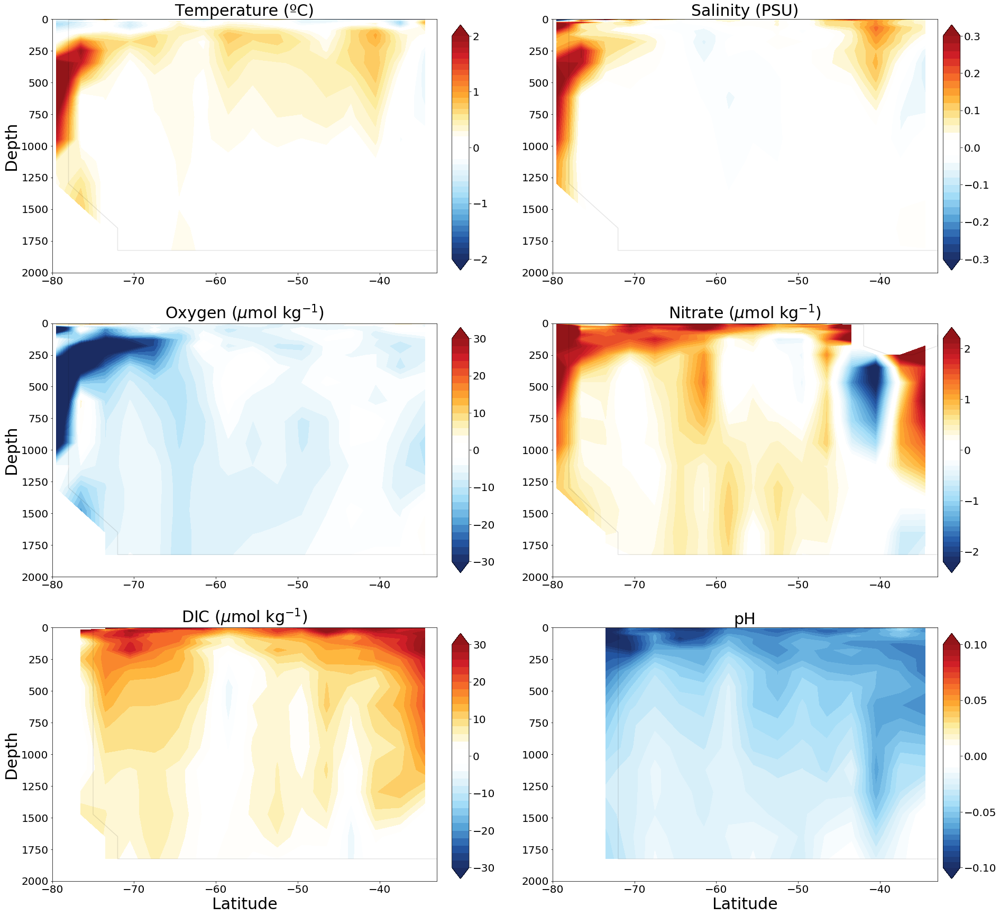

In [10]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')

# temp
norm = col.Normalize(vmin=-2,vmax=2) 
levels = np.arange(-2,2.01,0.1)
temp = zonal_contour_plot(ax, Ben_anomaly_Temp_zonal, Ben_anomaly_Temp_zonal.latitude-1.5, Ben_anomaly_Temp_zonal.depth, cmap , norm , levels)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
#salt
norm = col.Normalize(vmin=-0.3,vmax=0.3) 
levels = np.arange(-0.3,0.31,0.02)
salt = zonal_contour_plot(ax1, Ben_anomaly_Salt_zonal, Ben_anomaly_Salt_zonal.latitude-1.5, Ben_anomaly_Salt_zonal.depth, cmap , norm , levels)
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_contour_plot(ax2, Ben_anomaly_Oxygen_zonal, Ben_anomaly_Oxygen_zonal.latitude-1.5, Ben_anomaly_Oxygen_zonal.depth, cmap , norm , levels)
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_contour_plot(ax3, Ben_anomaly_Nitrate_zonal, Ben_anomaly_Nitrate_zonal.latitude-1.5, Ben_anomaly_Nitrate_zonal.depth, cmap , norm , levels)
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_contour_plot(ax4, Ben_anomaly_DIC_zonal, Ben_anomaly_DIC_zonal.latitude-1.5, Ben_anomaly_DIC_zonal.depth, cmap , norm , levels)
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#pH
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
levels = np.arange(-0.1,0.105,0.005)
pH = zonal_contour_plot(ax5, Ben_anomaly_pH_zonal, Ben_anomaly_pH_zonal.latitude-1.5, Ben_anomaly_pH_zonal.depth, cmap , norm , levels)
ax5.set_title(r'pH', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(pH,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

figurepath = 'F1_F2-original.png'
plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

## Reproduction, no bathymetry masking

#### no seasonal bias correction

(no pH but with density)

In [11]:
float_dir = '/work/Ruth.Moorman/SOCCOM-floats/LR_SOCCOM_20200308/processed_SOCCOM/'
ds = xr.open_dataset(float_dir+'SOCCOM_ALL_FLOAT-bronselaer-gridded-climatology.nc')
#temp
soccom_temp_linear_grid = ds.temp_linear.mean(dim = 'month')
soccom_temp_nearest_grid = ds.temp_nearest.mean(dim = 'month')
soccom_temp_cubic_grid = ds.temp_cubic.mean(dim = 'month')
soccom_temp_quad_grid = ds.temp_quad.mean(dim = 'month')
soccom_temp_grid = (soccom_temp_linear_grid+ soccom_temp_nearest_grid+ soccom_temp_cubic_grid+ soccom_temp_quad_grid)/4
soccom_temp_profile_count = ds.temp_profile_count
#salt
soccom_salt_linear_grid = ds.salt_linear.mean(dim = 'month')
soccom_salt_nearest_grid = ds.salt_nearest.mean(dim = 'month')
soccom_salt_cubic_grid = ds.salt_cubic.mean(dim = 'month')
soccom_salt_quad_grid = ds.salt_quad.mean(dim = 'month')
soccom_salt_grid = (soccom_salt_linear_grid+ soccom_salt_nearest_grid+ soccom_salt_cubic_grid+ soccom_salt_quad_grid)/4
soccom_salt_profile_count = ds.salt_profile_count
#nitrate
soccom_nitrate_linear_grid = ds.nitrate_linear.mean(dim = 'month')
soccom_nitrate_nearest_grid = ds.nitrate_nearest.mean(dim = 'month')
soccom_nitrate_cubic_grid = ds.nitrate_cubic.mean(dim = 'month')
soccom_nitrate_quad_grid = ds.nitrate_quad.mean(dim = 'month')
soccom_nitrate_grid = (soccom_nitrate_linear_grid+ soccom_nitrate_nearest_grid+ soccom_nitrate_cubic_grid+ soccom_nitrate_quad_grid)/4
soccom_nitrate_profile_count = ds.nitrate_profile_count
#oxygen
soccom_oxygen_linear_grid = ds.oxygen_linear.mean(dim = 'month')
soccom_oxygen_nearest_grid = ds.oxygen_nearest.mean(dim = 'month')
soccom_oxygen_cubic_grid = ds.oxygen_cubic.mean(dim = 'month')
soccom_oxygen_quad_grid = ds.oxygen_quad.mean(dim = 'month')
soccom_oxygen_grid = (soccom_oxygen_linear_grid+ soccom_oxygen_nearest_grid+ soccom_oxygen_cubic_grid+ soccom_oxygen_quad_grid)/4
soccom_oxygen_profile_count = ds.oxygen_profile_count
#dic
soccom_dic_linear_grid = ds.dic_linear.mean(dim = 'month')
soccom_dic_nearest_grid = ds.dic_nearest.mean(dim = 'month')
soccom_dic_cubic_grid = ds.dic_cubic.mean(dim = 'month')
soccom_dic_quad_grid = ds.dic_quad.mean(dim = 'month')
soccom_dic_grid = (soccom_dic_linear_grid+ soccom_dic_nearest_grid+ soccom_dic_cubic_grid+ soccom_dic_quad_grid)/4
soccom_dic_profile_count = ds.dic_profile_count
#sigma0
soccom_sigma_linear_grid = ds.sigma_linear.mean(dim = 'month')
soccom_sigma_nearest_grid = ds.sigma_nearest.mean(dim = 'month')
soccom_sigma_cubic_grid = ds.sigma_cubic.mean(dim = 'month')
soccom_sigma_quad_grid = ds.sigma_quad.mean(dim = 'month')
soccom_sigma_grid = (soccom_sigma_linear_grid+ soccom_sigma_nearest_grid+ soccom_sigma_cubic_grid+ soccom_sigma_quad_grid)/4
soccom_sigma_profile_count = ds.sigma_profile_count

In [12]:
float_dir = '/work/Ruth.Moorman/GLODAP/processed_GLODAP/'
ds = xr.open_dataset(float_dir+'GLODAP-bronselaer-gridded-climatology.nc')
#temp
glodap_temp_linear_grid = ds.temp_linear
glodap_temp_nearest_grid = ds.temp_nearest
glodap_temp_cubic_grid = ds.temp_cubic
glodap_temp_quad_grid = ds.temp_quad
glodap_temp_grid = (glodap_temp_linear_grid+glodap_temp_nearest_grid+glodap_temp_cubic_grid+glodap_temp_quad_grid)/4
#salt
glodap_salt_linear_grid = ds.salt_linear
glodap_salt_nearest_grid = ds.salt_nearest
glodap_salt_cubic_grid = ds.salt_cubic
glodap_salt_quad_grid = ds.salt_quad
glodap_salt_grid = (glodap_salt_linear_grid+glodap_salt_nearest_grid+glodap_salt_cubic_grid+glodap_salt_quad_grid)/4
#oxygen
glodap_oxyg_linear_grid = ds.oxygen_linear
glodap_oxyg_nearest_grid = ds.oxygen_nearest
glodap_oxyg_cubic_grid = ds.oxygen_cubic
glodap_oxyg_quad_grid = ds.oxygen_quad
glodap_oxyg_grid = (glodap_oxyg_linear_grid+glodap_oxyg_nearest_grid+glodap_oxyg_cubic_grid+glodap_oxyg_quad_grid)/4
#nitrate
glodap_nitr_linear_grid = ds.nitrate_linear
glodap_nitr_nearest_grid = ds.nitrate_nearest
glodap_nitr_cubic_grid = ds.nitrate_cubic
glodap_nitr_quad_grid = ds.nitrate_quad
glodap_nitr_grid = (glodap_nitr_linear_grid+glodap_nitr_nearest_grid+glodap_nitr_cubic_grid+glodap_nitr_quad_grid)/4
#dic
glodap_dic_linear_grid = ds.dic_linear
glodap_dic_nearest_grid = ds.dic_nearest
glodap_dic_cubic_grid = ds.dic_cubic
glodap_dic_quad_grid = ds.dic_quad
glodap_dic_grid = (glodap_dic_linear_grid+glodap_dic_nearest_grid+glodap_dic_cubic_grid+glodap_dic_quad_grid)/4

glodap_sigma_linear_grid = ds.sigma_linear
glodap_sigma_nearest_grid = ds.sigma_nearest
glodap_sigma_cubic_grid = ds.sigma_cubic
glodap_sigma_quad_grid = ds.sigma_quad
glodap_sigma_grid = (glodap_sigma_linear_grid+glodap_sigma_nearest_grid+glodap_sigma_cubic_grid+glodap_sigma_quad_grid)/4

In [13]:
Ruth_anomaly_Temp_zonal, Ruth_SOCCOM_Temp_zonal, Ruth_GLODAP_Temp_zonal = zonal_mean_overlapping(soccom_temp_grid,glodap_temp_grid)
Ruth_anomaly_Salt_zonal, Ruth_SOCCOM_Salt_zonal, Ruth_GLODAP_Salt_zonal = zonal_mean_overlapping(soccom_salt_grid,glodap_salt_grid)
Ruth_anomaly_Oxygen_zonal, Ruth_SOCCOM_Oxygen_zonal, Ruth_GLODAP_Oxygen_zonal = zonal_mean_overlapping(soccom_oxygen_grid,glodap_oxyg_grid)
Ruth_anomaly_Nitrate_zonal, Ruth_SOCCOM_Nitrate_zonal, Ruth_GLODAP_Nitrate_zonal = zonal_mean_overlapping(soccom_nitrate_grid,glodap_nitr_grid)
Ruth_anomaly_DIC_zonal, Ruth_SOCCOM_DIC_zonal, Ruth_GLODAP_DIC_zonal = zonal_mean_overlapping(soccom_dic_grid,glodap_dic_grid)
Ruth_anomaly_Sigma_zonal, Ruth_SOCCOM_Sigma_zonal, Ruth_GLODAP_Sigma_zonal = zonal_mean_overlapping(soccom_sigma_grid,glodap_sigma_grid)

Let's plot teh overlap for these products...

In [14]:
def mean_1000m_overlapping(soccom, glodap):
    # only cells that overlap
    soccom_overlap = soccom.fillna(999999)
    glodap_overlap = glodap.fillna(999999)
    soccom_overlap = soccom_overlap.where(glodap_overlap != 999999) 
    glodap_overlap = glodap_overlap.where(soccom_overlap != 999999) 
    soccom_overlap = soccom_overlap.where(soccom_overlap != 999999)
    glodap_overlap = glodap_overlap.where(glodap_overlap != 999999)
    #  mean
    depth_bin_center = np.array([4.,7.,12.,19.,26.,35.,47.,65.,91.,126.,179.,249.,346.,468.,614.,772.,947.,1123.,1298.,1474.,1649.,1825.,2000.])
    depth_bin_bounds = np.array([2.5,5.5,8.5,15.5,22.5,29.5,40.5,53.5,76.5,105.5,146.5,211.5,286.5,405.5,530.5,697.5,846.5,1047.5,1198.5,1397.5,1550.5,1747.5,1902.5,2097.5,])
    dzt = np.diff(depth_bin_bounds)
    dzt = xr.DataArray(dzt, dims = 'depth', coords={'depth':soccom_overlap.depth})
    soccom_overlap_1000m = (soccom_overlap.sel(depth = slice(None,1000))*dzt.sel(depth = slice(None,1000))).sum(dim = 'depth')/(dzt * (soccom_overlap * 0 + 1)).sel(depth = slice(None,1000)).sum(dim = 'depth')
    soccom_overlap_1000m = soccom_overlap_1000m.where(soccom_overlap_1000m !=0)
    glodap_overlap_1000m = (glodap_overlap.sel(depth = slice(None,1000))*dzt.sel(depth = slice(None,1000))).sum(dim = 'depth')/(dzt * (glodap_overlap * 0 + 1)).sel(depth = slice(None,1000)).sum(dim = 'depth')
    glodap_overlap_1000m = glodap_overlap_1000m.where(glodap_overlap_1000m !=0)
    # anomaly
    anomaly = soccom_overlap_1000m - glodap_overlap_1000m
    return anomaly, soccom_overlap_1000m, glodap_overlap_1000m

In [15]:
Ruth_anomaly_Temp_1000m, Ruth_SOCCOM_Temp_1000m, Ruth_GLODAP_Temp_1000m = mean_1000m_overlapping(soccom_temp_grid,glodap_temp_grid)
Ruth_anomaly_Salt_1000m, Ruth_SOCCOM_Salt_1000m, Ruth_GLODAP_Salt_1000m = mean_1000m_overlapping(soccom_salt_grid,glodap_salt_grid)
Ruth_anomaly_Oxygen_1000m, Ruth_SOCCOM_Oxygen_1000m, Ruth_GLODAP_Oxygen_1000m = mean_1000m_overlapping(soccom_oxygen_grid,glodap_oxyg_grid)
Ruth_anomaly_Nitrate_1000m, Ruth_SOCCOM_Nitrate_1000m, Ruth_GLODAP_Nitrate_1000m = mean_1000m_overlapping(soccom_nitrate_grid,glodap_nitr_grid)
Ruth_anomaly_DIC_1000m, Ruth_SOCCOM_DIC_1000m, Ruth_GLODAP_DIC_1000m = mean_1000m_overlapping(soccom_dic_grid,glodap_dic_grid)
Ruth_anomaly_Sigma_1000m, Ruth_SOCCOM_Sigma_1000m, Ruth_GLODAP_Sigma_1000m = mean_1000m_overlapping(soccom_sigma_grid,glodap_sigma_grid)

In [16]:
def plot_ben_grid(ax, data, cmap, lon = np.arange(0,364,8), lat = np.arange(-90,-30,3)):
    lat_north = -29
    ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
    ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
    temp = ax.pcolormesh(lon, lat,data,cmap = cmap, norm =norm, transform = ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    gl = ax.gridlines(linewidth = 1, color = 'grey', linestyle = '--', alpha = 0.3)
    gl.ylocator = mticker.FixedLocator(np.arange(-90,-30,3))
    gl.xlocator = mticker.FixedLocator(np.arange(0,364,8))
    return temp

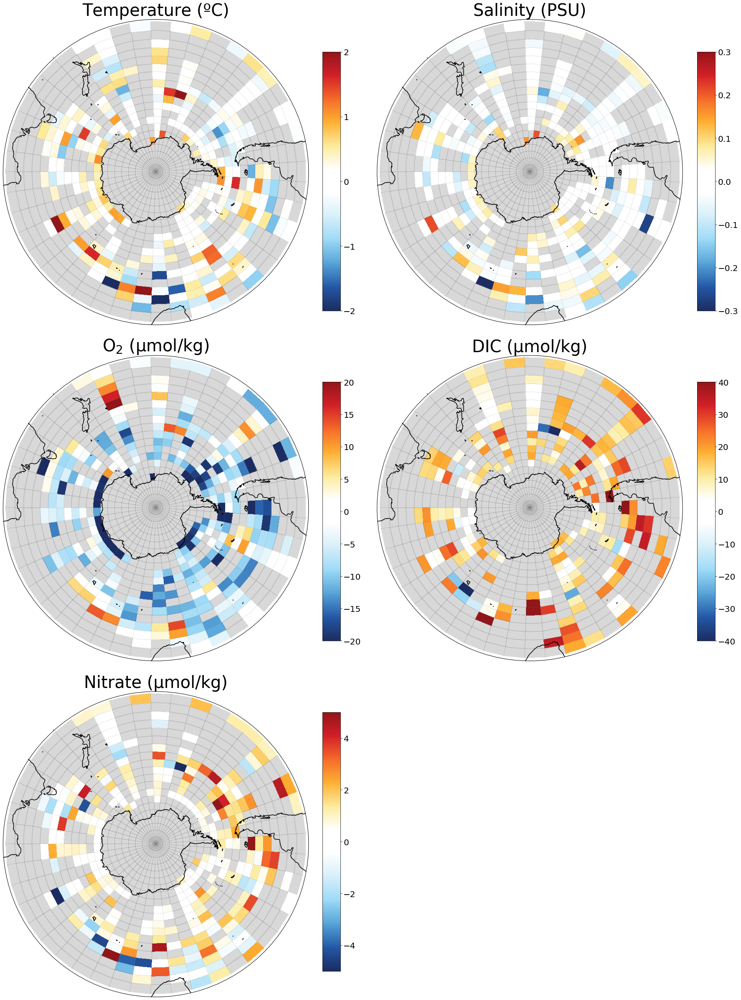

In [17]:
# temp only, for powerpoint
fig = plt.figure(figsize=[30, 43])
gs = gridspec.GridSpec(3,2)
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax, ax1, ax2, ax3, ax4 = plt.subplot(gs[0,0], projection =proj), plt.subplot(gs[0,1], projection =proj), plt.subplot(gs[1,0], projection =proj),plt.subplot(gs[1,1], projection =proj),plt.subplot(gs[2,0], projection =proj)
gs.update(wspace = 0.15, hspace = 0.1)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')
cmap.set_bad('grey',0.3)

norm = col.Normalize(vmin=-2,vmax=2) 
temp = plot_ben_grid(ax, Ruth_anomaly_Temp_1000m, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax.set_title('Temperature (ºC)', fontsize = 40)
cax = fig.add_axes([0.49, 0.655, 0.02, 0.2])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])

norm = col.Normalize(vmin=-0.3,vmax=0.3) 
salt = plot_ben_grid(ax1, Ruth_anomaly_Salt_1000m, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax1.set_title('Salinity (PSU)', fontsize = 40)
cax = fig.add_axes([0.905, 0.655, 0.02, 0.2])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])

norm = col.Normalize(vmin=-20,vmax=20) 
oxygen = plot_ben_grid(ax2, Ruth_anomaly_Oxygen_1000m, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax2.set_title('O$_2$ (µmol/kg)', fontsize = 40)
cax = fig.add_axes([0.49, 0.4, 0.02, 0.2])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-20,-15,-10,-5,0,5,10,15,20])

norm = col.Normalize(vmin=-40,vmax=40) 
dic = plot_ben_grid(ax3, Ruth_anomaly_DIC_1000m, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax3.set_title('DIC (µmol/kg)', fontsize = 40)
cax = fig.add_axes([0.905, 0.4, 0.02, 0.2])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-40,-30,-20,-10,0,10,20,30,40])

norm = col.Normalize(vmin=-5,vmax=5) 
nitrate = plot_ben_grid(ax4, Ruth_anomaly_Nitrate_1000m, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax4.set_title('Nitrate (µmol/kg)', fontsize = 40)
cax = fig.add_axes([0.49, 0.145, 0.02, 0.2])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-4,-2,0,2,4])

# norm = col.Normalize(vmin=-0.1,vmax=0.1) 
# pH = plot_ben_grid(ax5, Ben_anomaly_pH, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
# ax5.pcolor(np.arange(0,360,8),np.arange(-90,-30,3),sig_anomaly_pH_1000m, hatch='..', alpha = 0,transform = ccrs.PlateCarree())
# ax5.set_title('pH', fontsize = 40)
# cax = fig.add_axes([0.905, 0.145, 0.02, 0.2])
# cbar=plt.colorbar(pH,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

# figurepath = 'ano.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)


plt.show()

In [18]:
def zonal_contour_plot_sigma(ax, zonal_anomaly, latitude, depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal):
    colorbar = ax.contourf(latitude-1.5,depth, zonal_anomaly.values.T,levels = levels,cmap = cmap, norm = norm, extend = 'both')
    bathy_zonal = zonal_anomaly*0
    bathy_zonal = bathy_zonal.fillna(1)
    ax.contour(bathy_zonal.latitude-1.5,bathy_zonal.depth,bathy_zonal.values.T,[-1],colors = 'k', alpha = 0.1)
    sigma_levels = np.arange(25,29,0.25)
    mask = zonal_anomaly * 0 + 1
    soccom_sigma = soccom_sigma*mask
    glodap_sigma = glodap_sigma*mask
    ax.contour(soccom_sigma.latitude-1.5, soccom_sigma.depth, soccom_sigma.values.T, levels=sigma_levels, colors = 'k', linestyles = 'dashed',linewidths=1, alpha = 1)
    ax.contour(glodap_sigma.latitude-1.5, glodap_sigma.depth, glodap_sigma.values.T, levels=sigma_levels, colors = 'k', linewidths=1, alpha = 1)
    ax.set_ylim([2000,0])
    ax.set_xlim([-80,-33])
    return colorbar

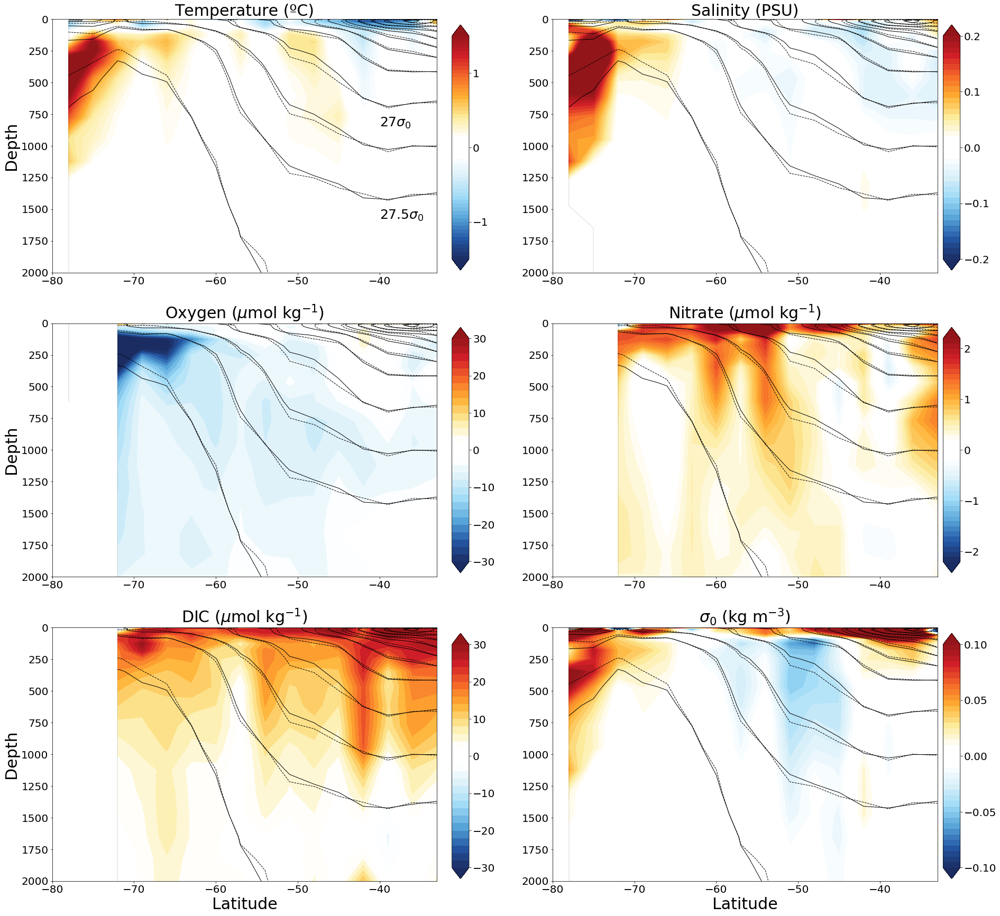

In [19]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')

# temp
norm = col.Normalize(vmin=-1.5,vmax=1.5) 
levels = np.arange(-1.5,1.51,0.05)
temp = zonal_contour_plot_sigma(ax, Ruth_anomaly_Temp_zonal, Ruth_anomaly_Temp_zonal.latitude, Ruth_anomaly_Temp_zonal.depth, cmap , norm , levels)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
ax.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax.text(-40, 850, r'27$\sigma_0$', fontsize = 25)


#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.21,0.01)
salt = zonal_contour_plot_sigma(ax1, Ruth_anomaly_Salt_zonal, Ruth_anomaly_Salt_zonal.latitude, Ruth_anomaly_Salt_zonal.depth, cmap , norm , levels)
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_contour_plot_sigma(ax2, Ruth_anomaly_Oxygen_zonal, Ruth_anomaly_Oxygen_zonal.latitude, Ruth_anomaly_Oxygen_zonal.depth, cmap , norm , levels)
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_contour_plot_sigma(ax3, Ruth_anomaly_Nitrate_zonal, Ruth_anomaly_Nitrate_zonal.latitude, Ruth_anomaly_Nitrate_zonal.depth, cmap , norm , levels)
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_contour_plot_sigma(ax4, Ruth_anomaly_DIC_zonal, Ruth_anomaly_DIC_zonal.latitude, Ruth_anomaly_DIC_zonal.depth, cmap , norm , levels)
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#sigma0
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
levels = np.arange(-0.1,0.105,0.005)
sigma = zonal_contour_plot_sigma(ax5, Ruth_anomaly_Sigma_zonal, Ruth_anomaly_Sigma_zonal.latitude, Ruth_anomaly_Sigma_zonal.depth, cmap , norm , levels)
ax5.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

figurepath = 'F1_F2-reproduction-contourf.png'
plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

In [20]:
def zonal_mesh_plot_sigma(ax, zonal_anomaly, latitude, depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal):
#     colorbar = ax.contourf(latitude-1.5,depth, zonal_anomaly.values.T,levels = levels,cmap = cmap, norm = norm, extend = 'both')
    colorbar = ax.pcolormesh(latitude-1.5,depth, zonal_anomaly.values.T,cmap = cmap, norm =norm)
    sigma_levels = np.arange(25,29,0.25)
    mask = zonal_anomaly * 0 + 1
    soccom_sigma = soccom_sigma*mask
    glodap_sigma = glodap_sigma*mask
    ax.contour(soccom_sigma.latitude-1.5, soccom_sigma.depth, soccom_sigma.values.T, levels=sigma_levels, colors = 'k', linestyles = 'dashed',linewidths=1, alpha = 1)
    ax.contour(glodap_sigma.latitude-1.5, glodap_sigma.depth, glodap_sigma.values.T, levels=sigma_levels, colors = 'k', linewidths=1, alpha = 1)
    ax.set_ylim([2000,0])
    ax.set_xlim([-80,-33])
    return colorbar

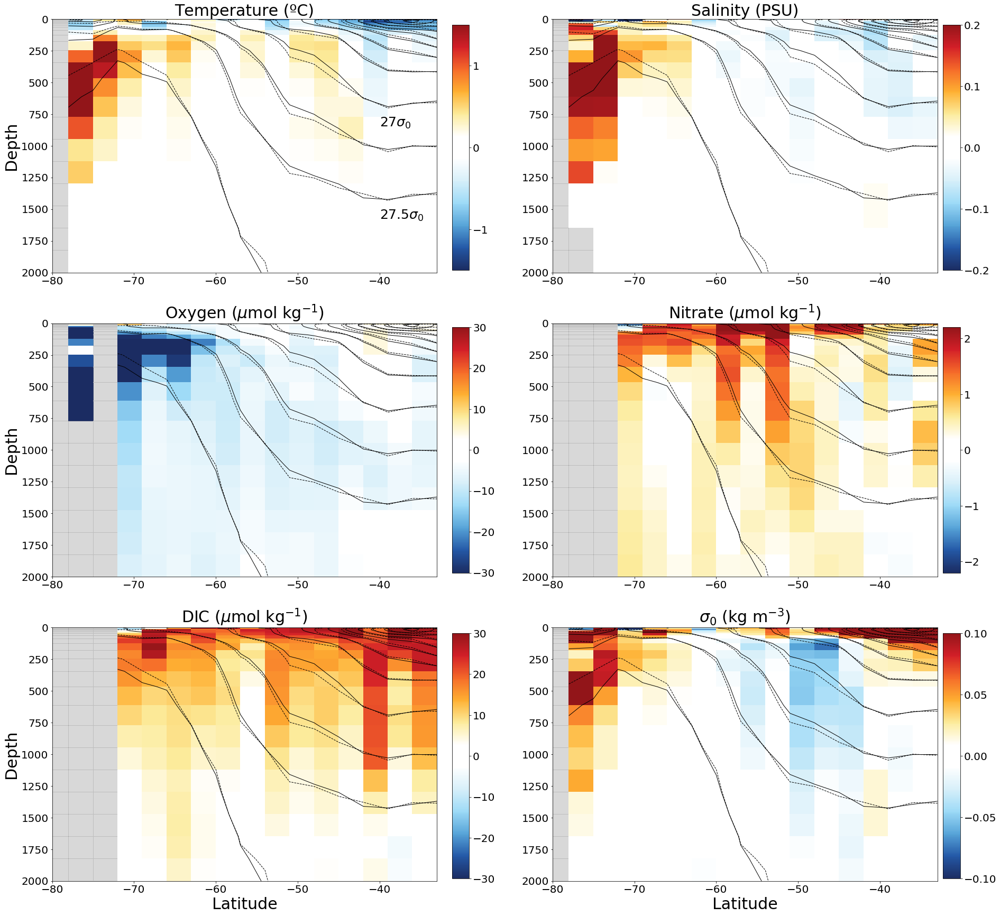

In [21]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')
cmap.set_bad('grey',0.3)

# temp
norm = col.Normalize(vmin=-1.5,vmax=1.5) 
temp = zonal_mesh_plot_sigma(ax, Ruth_anomaly_Temp_zonal, Ruth_anomaly_Temp_zonal.latitude, Ruth_anomaly_Temp_zonal.depth, cmap , norm)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
ax.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
salt = zonal_mesh_plot_sigma(ax1, Ruth_anomaly_Salt_zonal, Ruth_anomaly_Salt_zonal.latitude, Ruth_anomaly_Salt_zonal.depth, cmap , norm )
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
oxygen = zonal_mesh_plot_sigma(ax2, Ruth_anomaly_Oxygen_zonal, Ruth_anomaly_Oxygen_zonal.latitude, Ruth_anomaly_Oxygen_zonal.depth, cmap , norm )
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_mesh_plot_sigma(ax3, Ruth_anomaly_Nitrate_zonal, Ruth_anomaly_Nitrate_zonal.latitude, Ruth_anomaly_Nitrate_zonal.depth, cmap , norm )
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
dic = zonal_mesh_plot_sigma(ax4, Ruth_anomaly_DIC_zonal, Ruth_anomaly_DIC_zonal.latitude, Ruth_anomaly_DIC_zonal.depth, cmap , norm )
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#sigma0
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
sigma = zonal_mesh_plot_sigma(ax5, Ruth_anomaly_Sigma_zonal, Ruth_anomaly_Sigma_zonal.latitude, Ruth_anomaly_Sigma_zonal.depth, cmap , norm )
ax5.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

# figurepath = 'F1_F2-reproduction-contourf.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

##### add a seasonal bias correction

In [22]:
float_dir = '/work/Ruth.Moorman/SOCCOM-floats/LR_SOCCOM_20200308/processed_SOCCOM/'
ds = xr.open_dataset(float_dir+'SOCCOM_ALL_FLOAT-bronselaer-gridded-climatology.nc')
#temp
soccom_temp_linear_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).temp_linear.mean(dim = 'month')
soccom_temp_nearest_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).temp_nearest.mean(dim = 'month')
soccom_temp_cubic_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).temp_cubic.mean(dim = 'month')
soccom_temp_quad_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).temp_quad.mean(dim = 'month')
soccom_temp_grid_DJFMAM = (soccom_temp_linear_grid_DJFMAM+ soccom_temp_nearest_grid_DJFMAM+ soccom_temp_cubic_grid_DJFMAM+ soccom_temp_quad_grid_DJFMAM)/4
#salt
soccom_salt_linear_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).salt_linear.mean(dim = 'month')
soccom_salt_nearest_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).salt_nearest.mean(dim = 'month')
soccom_salt_cubic_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).salt_cubic.mean(dim = 'month')
soccom_salt_quad_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).salt_quad.mean(dim = 'month')
soccom_salt_grid_DJFMAM = (soccom_salt_linear_grid_DJFMAM+ soccom_salt_nearest_grid_DJFMAM+ soccom_salt_cubic_grid_DJFMAM+ soccom_salt_quad_grid_DJFMAM)/4
#nitrate
soccom_nitrate_linear_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).nitrate_linear.mean(dim = 'month')
soccom_nitrate_nearest_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).nitrate_nearest.mean(dim = 'month')
soccom_nitrate_cubic_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).nitrate_cubic.mean(dim = 'month')
soccom_nitrate_quad_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).nitrate_quad.mean(dim = 'month')
soccom_nitrate_grid_DJFMAM = (soccom_nitrate_linear_grid_DJFMAM+ soccom_nitrate_nearest_grid_DJFMAM+ soccom_nitrate_cubic_grid_DJFMAM+ soccom_nitrate_quad_grid_DJFMAM)/4
#oxygen
soccom_oxygen_linear_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).oxygen_linear.mean(dim = 'month')
soccom_oxygen_nearest_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).oxygen_nearest.mean(dim = 'month')
soccom_oxygen_cubic_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).oxygen_cubic.mean(dim = 'month')
soccom_oxygen_quad_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).oxygen_quad.mean(dim = 'month')
soccom_oxygen_grid_DJFMAM = (soccom_oxygen_linear_grid_DJFMAM+ soccom_oxygen_nearest_grid_DJFMAM+ soccom_oxygen_cubic_grid_DJFMAM+ soccom_oxygen_quad_grid_DJFMAM)/4
#dic
soccom_dic_linear_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).dic_linear.mean(dim = 'month')
soccom_dic_nearest_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).dic_nearest.mean(dim = 'month')
soccom_dic_cubic_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).dic_cubic.mean(dim = 'month')
soccom_dic_quad_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).dic_quad.mean(dim = 'month')
soccom_dic_grid_DJFMAM = (soccom_dic_linear_grid_DJFMAM+ soccom_dic_nearest_grid_DJFMAM+ soccom_dic_cubic_grid_DJFMAM+ soccom_dic_quad_grid_DJFMAM)/4
#sigma0
soccom_sigma_linear_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).sigma_linear.mean(dim = 'month')
soccom_sigma_nearest_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).sigma_nearest.mean(dim = 'month')
soccom_sigma_cubic_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).sigma_cubic.mean(dim = 'month')
soccom_sigma_quad_grid_DJFMAM = ds.sel(month = [12,1,2,3,4,5]).sigma_quad.mean(dim = 'month')
soccom_sigma_grid_DJFMAM = (soccom_sigma_linear_grid_DJFMAM+ soccom_sigma_nearest_grid_DJFMAM+ soccom_sigma_cubic_grid_DJFMAM+ soccom_sigma_quad_grid_DJFMAM)/4

In [23]:
_ , Ruth_SOCCOM_Temp_zonal_DJFMAM, _ = zonal_mean_overlapping(soccom_temp_grid_DJFMAM,glodap_temp_grid)
_ , Ruth_SOCCOM_Salt_zonal_DJFMAM, _ = zonal_mean_overlapping(soccom_salt_grid_DJFMAM,glodap_salt_grid)
_ , Ruth_SOCCOM_Oxygen_zonal_DJFMAM, _ = zonal_mean_overlapping(soccom_oxygen_grid_DJFMAM,glodap_oxyg_grid)
_ , Ruth_SOCCOM_Nitrate_zonal_DJFMAM,_  = zonal_mean_overlapping(soccom_nitrate_grid_DJFMAM,glodap_nitr_grid)
_ , Ruth_SOCCOM_DIC_zonal_DJFMAM, _ = zonal_mean_overlapping(soccom_dic_grid_DJFMAM,glodap_dic_grid)
_ , Ruth_SOCCOM_Sigma_zonal_DJFMAM,  _= zonal_mean_overlapping(soccom_sigma_grid_DJFMAM,glodap_sigma_grid)

In [24]:
Ruth_SOCCOM_Temp_zonal_summer_bias = Ruth_SOCCOM_Temp_zonal_DJFMAM - Ruth_SOCCOM_Temp_zonal
Ruth_SOCCOM_Salt_zonal_summer_bias  = Ruth_SOCCOM_Salt_zonal_DJFMAM - Ruth_SOCCOM_Salt_zonal
Ruth_SOCCOM_Oxygen_zonal_summer_bias  = Ruth_SOCCOM_Oxygen_zonal_DJFMAM - Ruth_SOCCOM_Oxygen_zonal
Ruth_SOCCOM_Nitrate_zonal_summer_bias  = Ruth_SOCCOM_Nitrate_zonal_DJFMAM - Ruth_SOCCOM_Nitrate_zonal
Ruth_SOCCOM_DIC_zonal_summer_bias  = Ruth_SOCCOM_DIC_zonal_DJFMAM - Ruth_SOCCOM_DIC_zonal
Ruth_SOCCOM_Sigma_zonal_summer_bias  = Ruth_SOCCOM_Sigma_zonal_DJFMAM - Ruth_SOCCOM_Sigma_zonal

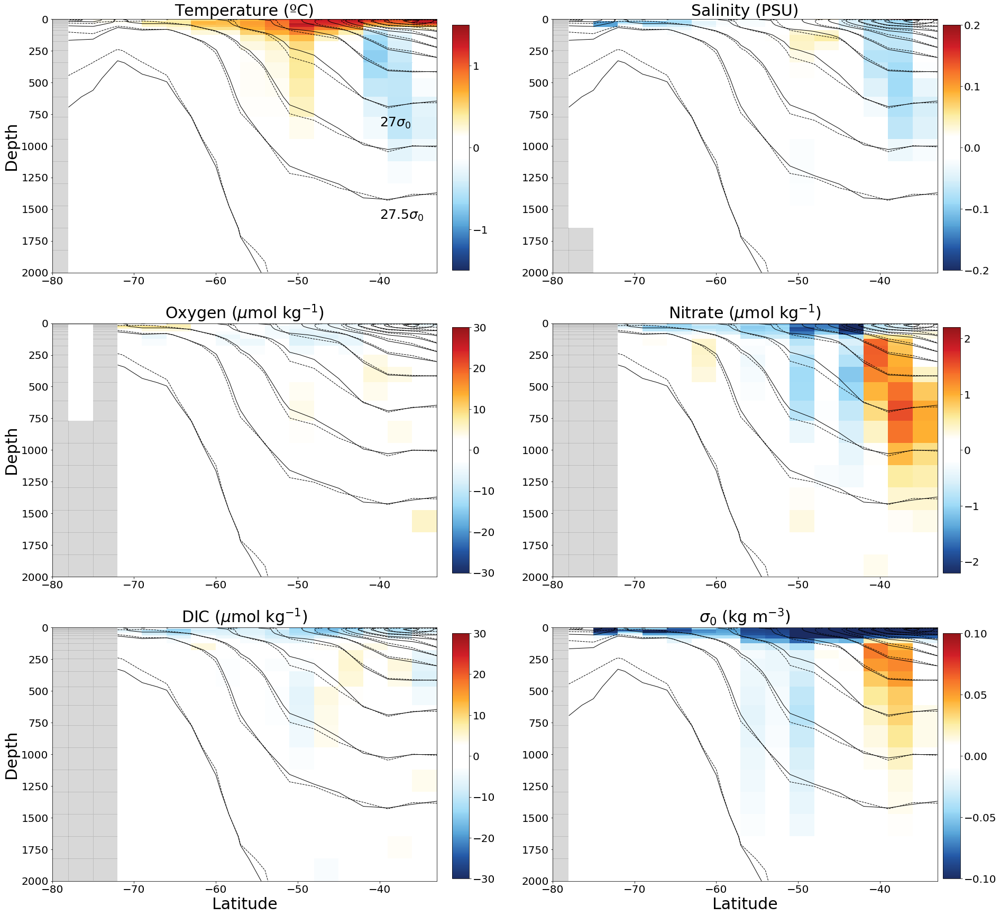

In [25]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')
cmap.set_bad('grey',0.3)

# temp
norm = col.Normalize(vmin=-1.5,vmax=1.5) 
levels = np.arange(-1.5,1.51,0.05)
temp = zonal_mesh_plot_sigma(ax, Ruth_SOCCOM_Temp_zonal_summer_bias, Ruth_SOCCOM_Temp_zonal_summer_bias.latitude, Ruth_SOCCOM_Temp_zonal_summer_bias.depth, cmap , norm )
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
ax.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.21,0.01)
salt = zonal_mesh_plot_sigma(ax1, Ruth_SOCCOM_Salt_zonal_summer_bias, Ruth_SOCCOM_Salt_zonal_summer_bias.latitude, Ruth_SOCCOM_Salt_zonal_summer_bias.depth, cmap , norm )
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_mesh_plot_sigma(ax2, Ruth_SOCCOM_Oxygen_zonal_summer_bias, Ruth_SOCCOM_Oxygen_zonal_summer_bias.latitude, Ruth_SOCCOM_Oxygen_zonal_summer_bias.depth, cmap , norm )
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_mesh_plot_sigma(ax3, Ruth_SOCCOM_Nitrate_zonal_summer_bias, Ruth_SOCCOM_Nitrate_zonal_summer_bias.latitude, Ruth_SOCCOM_Nitrate_zonal_summer_bias.depth, cmap , norm )
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_mesh_plot_sigma(ax4, Ruth_SOCCOM_DIC_zonal_summer_bias, Ruth_SOCCOM_DIC_zonal_summer_bias.latitude, Ruth_SOCCOM_DIC_zonal_summer_bias.depth, cmap , norm )
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#sigma0
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
levels = np.arange(-0.1,0.105,0.005)
sigma = zonal_mesh_plot_sigma(ax5, Ruth_SOCCOM_Sigma_zonal_summer_bias, Ruth_SOCCOM_Sigma_zonal_summer_bias.latitude, Ruth_SOCCOM_Sigma_zonal_summer_bias.depth, cmap , norm )
ax5.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

# figurepath = 'F1_F2-reproduction-no-bathymery.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

In [26]:
# glodap seasonal bias correction
Ruth_GLODAP_Temp_zonal_BC = Ruth_GLODAP_Temp_zonal - Ruth_SOCCOM_Temp_zonal_summer_bias
Ruth_GLODAP_Salt_zonal_BC = Ruth_GLODAP_Salt_zonal - Ruth_SOCCOM_Salt_zonal_summer_bias
Ruth_GLODAP_Oxygen_zonal_BC = Ruth_GLODAP_Oxygen_zonal - Ruth_SOCCOM_Oxygen_zonal_summer_bias
Ruth_GLODAP_Nitrate_zonal_BC = Ruth_GLODAP_Nitrate_zonal - Ruth_SOCCOM_Nitrate_zonal_summer_bias
Ruth_GLODAP_DIC_zonal_BC = Ruth_GLODAP_DIC_zonal - Ruth_SOCCOM_DIC_zonal_summer_bias
Ruth_GLODAP_Sigma_zonal_BC = Ruth_GLODAP_Sigma_zonal - Ruth_SOCCOM_Sigma_zonal_summer_bias

In [27]:
Ruth_anomaly_Temp_zonal_BC = Ruth_SOCCOM_Temp_zonal - Ruth_GLODAP_Temp_zonal_BC
Ruth_anomaly_Salt_zonal_BC = Ruth_SOCCOM_Salt_zonal - Ruth_GLODAP_Salt_zonal_BC
Ruth_anomaly_Oxygen_zonal_BC = Ruth_SOCCOM_Oxygen_zonal - Ruth_GLODAP_Oxygen_zonal_BC
Ruth_anomaly_Nitrate_zonal_BC = Ruth_SOCCOM_Nitrate_zonal - Ruth_GLODAP_Nitrate_zonal_BC
Ruth_anomaly_DIC_zonal_BC = Ruth_SOCCOM_DIC_zonal - Ruth_GLODAP_DIC_zonal_BC
Ruth_anomaly_Sigma_zonal_BC = Ruth_SOCCOM_Sigma_zonal - Ruth_GLODAP_Sigma_zonal_BC

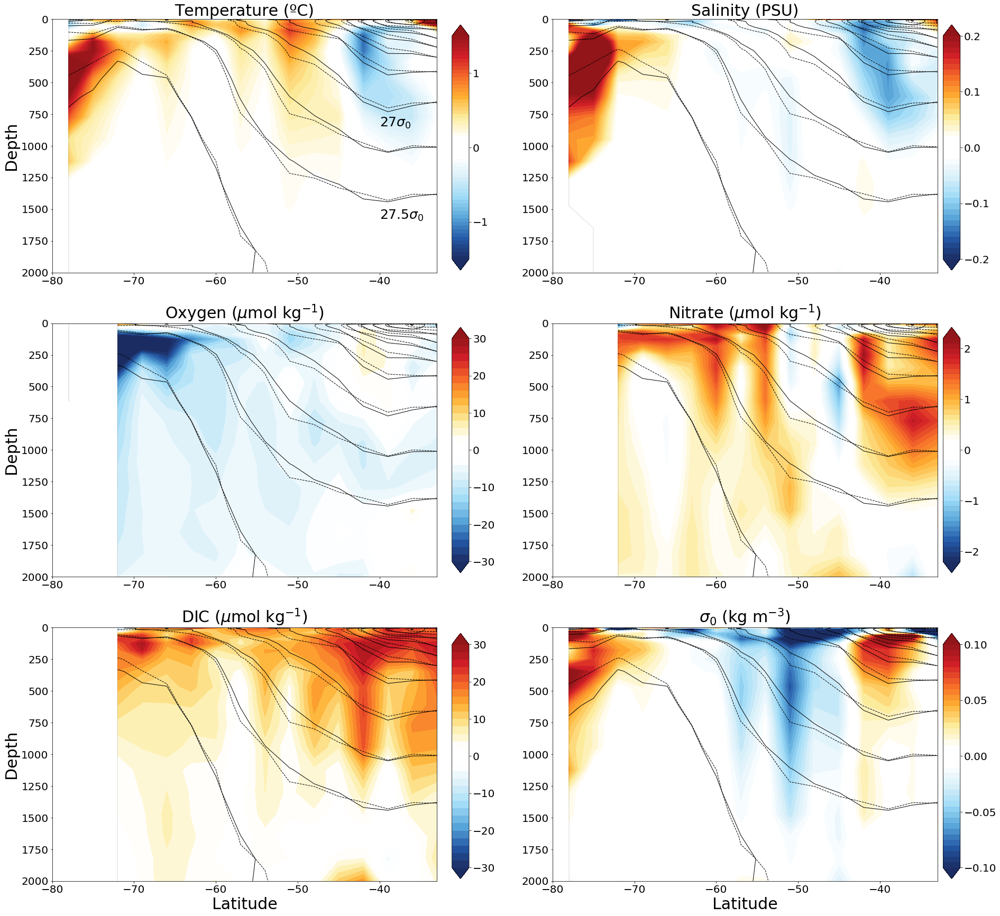

In [28]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')
cmap.set_bad('grey',0.3)

# temp
norm = col.Normalize(vmin=-1.5,vmax=1.5) 
levels = np.arange(-1.5,1.51,0.05)
temp = zonal_contour_plot_sigma(ax, Ruth_anomaly_Temp_zonal_BC, Ruth_anomaly_Temp_zonal_BC.latitude, Ruth_anomaly_Temp_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
ax.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax.text(-40, 850, r'27$\sigma_0$', fontsize = 25)


#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.21,0.01)
salt = zonal_contour_plot_sigma(ax1, Ruth_anomaly_Salt_zonal_BC, Ruth_anomaly_Salt_zonal_BC.latitude, Ruth_anomaly_Salt_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_contour_plot_sigma(ax2, Ruth_anomaly_Oxygen_zonal_BC, Ruth_anomaly_Oxygen_zonal_BC.latitude, Ruth_anomaly_Oxygen_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_contour_plot_sigma(ax3, Ruth_anomaly_Nitrate_zonal_BC, Ruth_anomaly_Nitrate_zonal_BC.latitude, Ruth_anomaly_Nitrate_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_contour_plot_sigma(ax4, Ruth_anomaly_DIC_zonal_BC, Ruth_anomaly_DIC_zonal_BC.latitude, Ruth_anomaly_DIC_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#sigma0
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
levels = np.arange(-0.1,0.105,0.005)
sigma = zonal_contour_plot_sigma(ax5, Ruth_anomaly_Sigma_zonal_BC, Ruth_anomaly_Sigma_zonal_BC.latitude, Ruth_anomaly_Sigma_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax5.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

figurepath = 'F1_F2-reproduction-no-bathymetry-contour.png'
plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

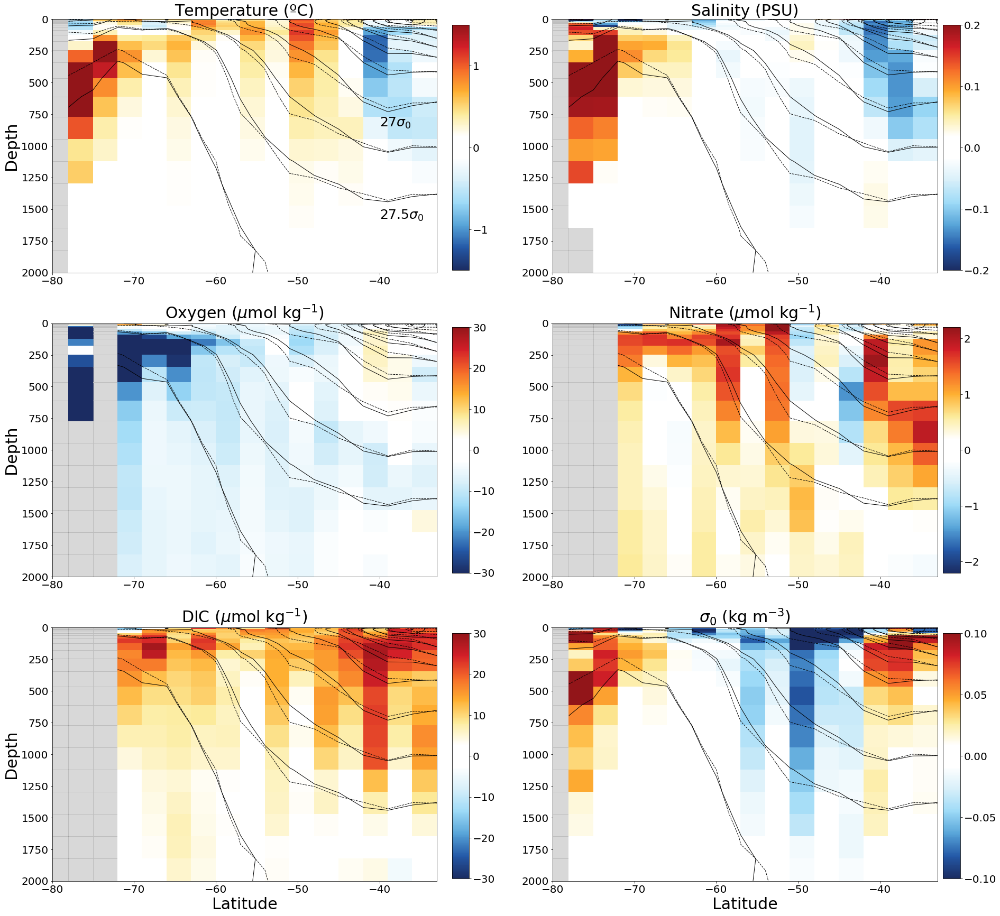

In [29]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')
cmap.set_bad('grey',0.3)

# temp
norm = col.Normalize(vmin=-1.5,vmax=1.5) 
levels = np.arange(-1.5,1.51,0.05)
temp = zonal_mesh_plot_sigma(ax, Ruth_anomaly_Temp_zonal_BC, Ruth_anomaly_Temp_zonal_BC.latitude, Ruth_anomaly_Temp_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
ax.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.21,0.01)
salt = zonal_mesh_plot_sigma(ax1, Ruth_anomaly_Salt_zonal_BC, Ruth_anomaly_Salt_zonal_BC.latitude, Ruth_anomaly_Salt_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_mesh_plot_sigma(ax2, Ruth_anomaly_Oxygen_zonal_BC, Ruth_anomaly_Oxygen_zonal_BC.latitude, Ruth_anomaly_Oxygen_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_mesh_plot_sigma(ax3, Ruth_anomaly_Nitrate_zonal_BC, Ruth_anomaly_Nitrate_zonal_BC.latitude, Ruth_anomaly_Nitrate_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_mesh_plot_sigma(ax4, Ruth_anomaly_DIC_zonal_BC, Ruth_anomaly_DIC_zonal_BC.latitude, Ruth_anomaly_DIC_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#sigma0
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
levels = np.arange(-0.1,0.105,0.005)
sigma = zonal_mesh_plot_sigma(ax5, Ruth_anomaly_Sigma_zonal_BC, Ruth_anomaly_Sigma_zonal_BC.latitude, Ruth_anomaly_Sigma_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax5.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

figurepath = 'F1_F2-reproduction-no-bathymetry-mesh.png'
plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

## Reproduction: with bathymetry masking

##### no seasonal masking

In [30]:
float_dir = '/work/Ruth.Moorman/GLODAP/processed_GLODAP/'
ds = xr.open_dataset(float_dir+'GLODAP-bathymetry-bronselaer-gridded-climatology.nc')
#temp
glodap_temp_linear_grid = ds.temp_linear
glodap_temp_nearest_grid = ds.temp_nearest
glodap_temp_cubic_grid = ds.temp_cubic
glodap_temp_quad_grid = ds.temp_quad
glodap_temp_grid_bathy = (glodap_temp_linear_grid+glodap_temp_nearest_grid+glodap_temp_cubic_grid+glodap_temp_quad_grid)/4
#salt
glodap_salt_linear_grid = ds.salt_linear
glodap_salt_nearest_grid = ds.salt_nearest
glodap_salt_cubic_grid = ds.salt_cubic
glodap_salt_quad_grid = ds.salt_quad
glodap_salt_grid_bathy = (glodap_salt_linear_grid+glodap_salt_nearest_grid+glodap_salt_cubic_grid+glodap_salt_quad_grid)/4
#oxygen
glodap_oxyg_linear_grid = ds.oxygen_linear
glodap_oxyg_nearest_grid = ds.oxygen_nearest
glodap_oxyg_cubic_grid = ds.oxygen_cubic
glodap_oxyg_quad_grid = ds.oxygen_quad
glodap_oxyg_grid_bathy = (glodap_oxyg_linear_grid+glodap_oxyg_nearest_grid+glodap_oxyg_cubic_grid+glodap_oxyg_quad_grid)/4
#nitrate
glodap_nitr_linear_grid = ds.nitrate_linear
glodap_nitr_nearest_grid = ds.nitrate_nearest
glodap_nitr_cubic_grid = ds.nitrate_cubic
glodap_nitr_quad_grid = ds.nitrate_quad
glodap_nitr_grid_bathy = (glodap_nitr_linear_grid+glodap_nitr_nearest_grid+glodap_nitr_cubic_grid+glodap_nitr_quad_grid)/4
#dic
glodap_dic_linear_grid = ds.dic_linear
glodap_dic_nearest_grid = ds.dic_nearest
glodap_dic_cubic_grid = ds.dic_cubic
glodap_dic_quad_grid = ds.dic_quad
glodap_dic_grid_bathy = (glodap_dic_linear_grid+glodap_dic_nearest_grid+glodap_dic_cubic_grid+glodap_dic_quad_grid)/4

glodap_sigma_linear_grid = ds.sigma_linear
glodap_sigma_nearest_grid = ds.sigma_nearest
glodap_sigma_cubic_grid = ds.sigma_cubic
glodap_sigma_quad_grid = ds.sigma_quad
glodap_sigma_grid_bathy = (glodap_sigma_linear_grid+glodap_sigma_nearest_grid+glodap_sigma_cubic_grid+glodap_sigma_quad_grid)/4

In [31]:
Ruth_anomaly_Temp_zonal_bathy, Ruth_SOCCOM_Temp_zonal_bathy, Ruth_GLODAP_Temp_zonal_bathy = zonal_mean_overlapping(soccom_temp_grid,glodap_temp_grid_bathy)
Ruth_anomaly_Salt_zonal_bathy, Ruth_SOCCOM_Salt_zonal_bathy, Ruth_GLODAP_Salt_zonal_bathy = zonal_mean_overlapping(soccom_salt_grid,glodap_salt_grid_bathy)
Ruth_anomaly_Oxygen_zonal_bathy, Ruth_SOCCOM_Oxygen_zonal_bathy, Ruth_GLODAP_Oxygen_zonal_bathy = zonal_mean_overlapping(soccom_oxygen_grid,glodap_oxyg_grid_bathy)
Ruth_anomaly_Nitrate_zonal_bathy, Ruth_SOCCOM_Nitrate_zonal_bathy, Ruth_GLODAP_Nitrate_zonal_bathy = zonal_mean_overlapping(soccom_nitrate_grid,glodap_nitr_grid_bathy)
Ruth_anomaly_DIC_zonal_bathy, Ruth_SOCCOM_DIC_zonal_bathy, Ruth_GLODAP_DIC_zonal_bathy = zonal_mean_overlapping(soccom_dic_grid,glodap_dic_grid_bathy)
Ruth_anomaly_Sigma_zonal_bathy, Ruth_SOCCOM_Sigma_zonal_bathy, Ruth_GLODAP_Sigma_zonal_bathy = zonal_mean_overlapping(soccom_sigma_grid,glodap_sigma_grid_bathy)

In [32]:
Ruth_anomaly_Temp_1000m_bathy, Ruth_SOCCOM_Temp_1000m_bathy, Ruth_GLODAP_Temp_1000m_bathy = mean_1000m_overlapping(soccom_temp_grid,glodap_temp_grid_bathy)
Ruth_anomaly_Salt_1000m_bathy, Ruth_SOCCOM_Salt_1000m_bathy, Ruth_GLODAP_Salt_1000m_bathy = mean_1000m_overlapping(soccom_salt_grid,glodap_salt_grid_bathy)
Ruth_anomaly_Oxygen_1000m_bathy, Ruth_SOCCOM_Oxygen_1000m_bathy, Ruth_GLODAP_Oxygen_1000m_bathy = mean_1000m_overlapping(soccom_oxygen_grid,glodap_oxyg_grid_bathy)
Ruth_anomaly_Nitrate_1000m_bathy, Ruth_SOCCOM_Nitrate_1000m_bathy, Ruth_GLODAP_Nitrate_1000m_bathy = mean_1000m_overlapping(soccom_nitrate_grid,glodap_nitr_grid_bathy)
Ruth_anomaly_DIC_1000m_bathy, Ruth_SOCCOM_DIC_1000m_bathy, Ruth_GLODAP_DIC_1000m_bathy = mean_1000m_overlapping(soccom_dic_grid,glodap_dic_grid_bathy)
Ruth_anomaly_Sigma_1000m_bathy, Ruth_SOCCOM_Sigma_1000m_bathy, Ruth_GLODAP_Sigma_1000m_bathy = mean_1000m_overlapping(soccom_sigma_grid,glodap_sigma_grid_bathy)

In [33]:
def plot_ben_grid(ax, data, cmap, lon = np.arange(0,364,8), lat = np.arange(-90,-30,3)):
    lat_north = -29
    ax.set_extent([-180, 180, -90, lat_north], ccrs.PlateCarree())
    ax.contour(land_map.sel(yt_ocean = slice(-90,lat_north)).xt_ocean, land_map.sel(yt_ocean = slice(-90,lat_north)).yt_ocean,land_map.sel(yt_ocean = slice(-90,lat_north)),[0,1], colors = 'k', alpha = 1, transform=ccrs.PlateCarree())
    temp = ax.pcolormesh(lon, lat,data,cmap = cmap, norm =norm, transform = ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    gl = ax.gridlines(linewidth = 1, color = 'grey', linestyle = '--', alpha = 0.3)
    gl.ylocator = mticker.FixedLocator(np.arange(-90,-30,3))
    gl.xlocator = mticker.FixedLocator(np.arange(0,364,8))
    return temp

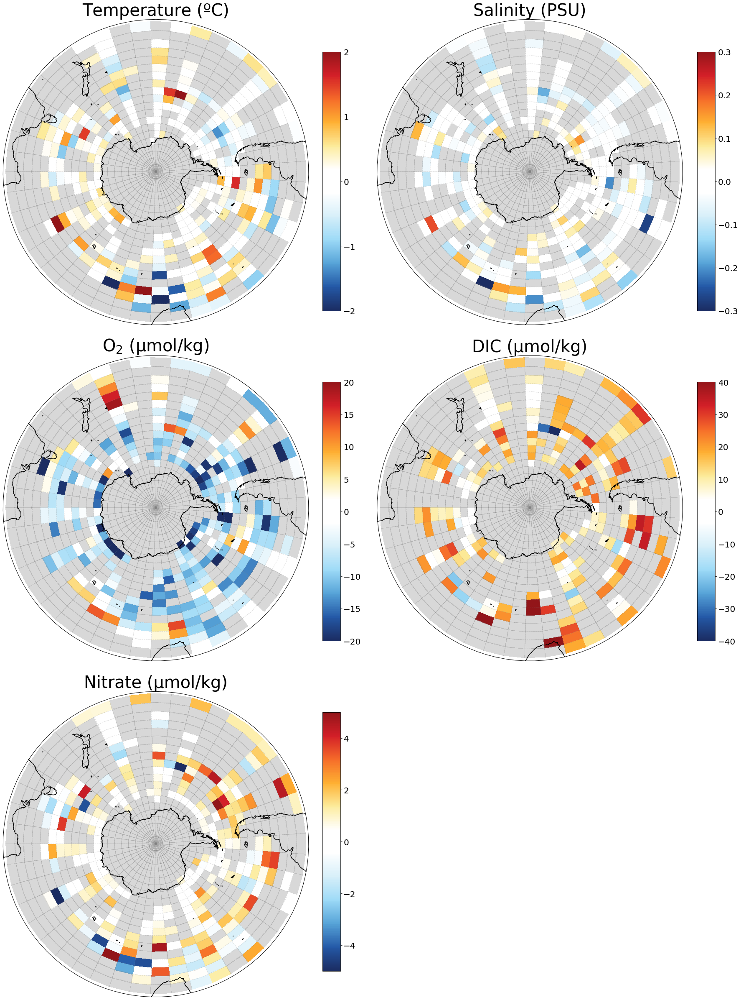

In [34]:
# temp only, for powerpoint
fig = plt.figure(figsize=[30, 43])
gs = gridspec.GridSpec(3,2)
proj = ccrs.Stereographic(central_longitude=-150,central_latitude=-90)
ax, ax1, ax2, ax3, ax4 = plt.subplot(gs[0,0], projection =proj), plt.subplot(gs[0,1], projection =proj), plt.subplot(gs[1,0], projection =proj),plt.subplot(gs[1,1], projection =proj),plt.subplot(gs[2,0], projection =proj)
gs.update(wspace = 0.15, hspace = 0.1)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')
cmap.set_bad('grey',0.3)

norm = col.Normalize(vmin=-2,vmax=2) 
temp = plot_ben_grid(ax, Ruth_anomaly_Temp_1000m_bathy, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax.set_title('Temperature (ºC)', fontsize = 40)
cax = fig.add_axes([0.49, 0.655, 0.02, 0.2])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])

norm = col.Normalize(vmin=-0.3,vmax=0.3) 
salt = plot_ben_grid(ax1, Ruth_anomaly_Salt_1000m_bathy, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax1.set_title('Salinity (PSU)', fontsize = 40)
cax = fig.add_axes([0.905, 0.655, 0.02, 0.2])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])

norm = col.Normalize(vmin=-20,vmax=20) 
oxygen = plot_ben_grid(ax2, Ruth_anomaly_Oxygen_1000m_bathy, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax2.set_title('O$_2$ (µmol/kg)', fontsize = 40)
cax = fig.add_axes([0.49, 0.4, 0.02, 0.2])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-20,-15,-10,-5,0,5,10,15,20])

norm = col.Normalize(vmin=-40,vmax=40) 
dic = plot_ben_grid(ax3, Ruth_anomaly_DIC_1000m_bathy, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax3.set_title('DIC (µmol/kg)', fontsize = 40)
cax = fig.add_axes([0.905, 0.4, 0.02, 0.2])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-40,-30,-20,-10,0,10,20,30,40])

norm = col.Normalize(vmin=-5,vmax=5) 
nitrate = plot_ben_grid(ax4, Ruth_anomaly_Nitrate_1000m_bathy, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
ax4.set_title('Nitrate (µmol/kg)', fontsize = 40)
cax = fig.add_axes([0.49, 0.145, 0.02, 0.2])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-4,-2,0,2,4])

# norm = col.Normalize(vmin=-0.1,vmax=0.1) 
# pH = plot_ben_grid(ax5, Ben_anomaly_pH, cmap, lon = np.arange(0,361,8), lat = np.arange(-90,-29,3))
# ax5.pcolor(np.arange(0,360,8),np.arange(-90,-30,3),sig_anomaly_pH_1000m, hatch='..', alpha = 0,transform = ccrs.PlateCarree())
# ax5.set_title('pH', fontsize = 40)
# cax = fig.add_axes([0.905, 0.145, 0.02, 0.2])
# cbar=plt.colorbar(pH,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

# figurepath = 'save_plot.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)


plt.show()

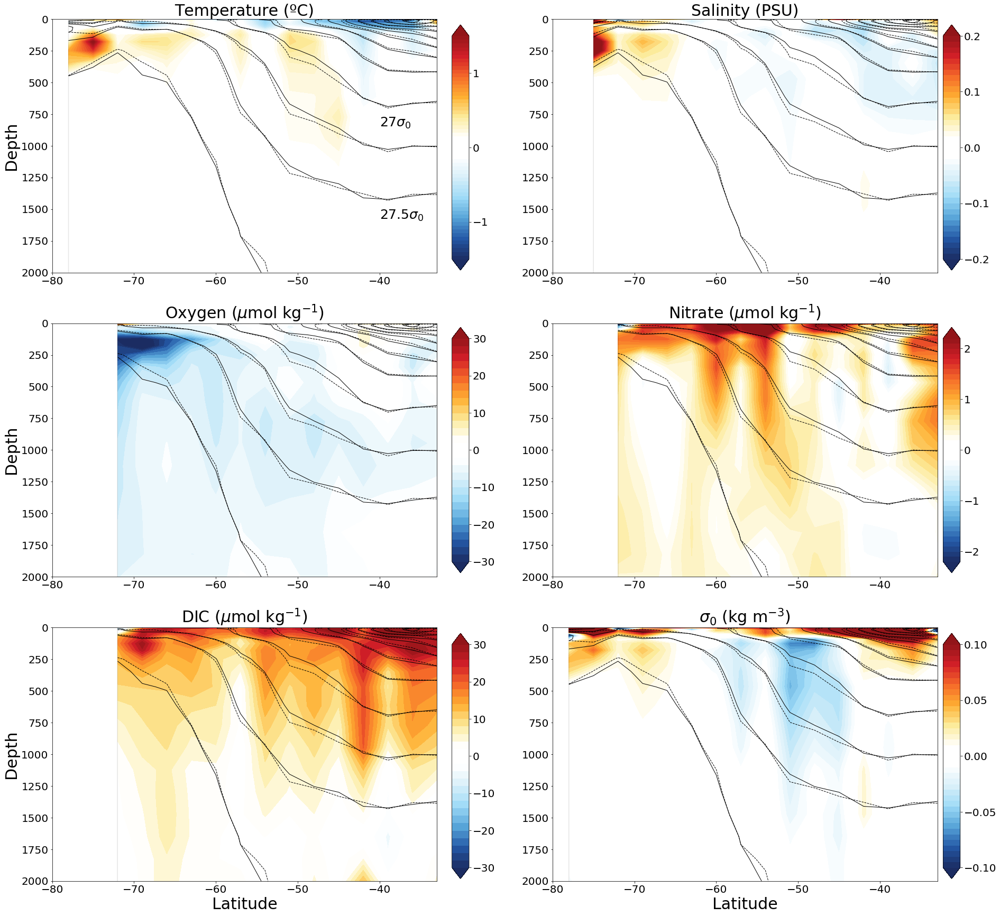

In [35]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')

# temp
norm = col.Normalize(vmin=-1.5,vmax=1.5) 
levels = np.arange(-1.5,1.51,0.05)
temp = zonal_contour_plot_sigma(ax, Ruth_anomaly_Temp_zonal_bathy, Ruth_anomaly_Temp_zonal_bathy.latitude, Ruth_anomaly_Temp_zonal_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
ax.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax.text(-40, 850, r'27$\sigma_0$', fontsize = 25)


#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.21,0.01)
salt = zonal_contour_plot_sigma(ax1, Ruth_anomaly_Salt_zonal_bathy, Ruth_anomaly_Salt_zonal_bathy.latitude, Ruth_anomaly_Salt_zonal_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_contour_plot_sigma(ax2, Ruth_anomaly_Oxygen_zonal_bathy, Ruth_anomaly_Oxygen_zonal_bathy.latitude, Ruth_anomaly_Oxygen_zonal_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_contour_plot_sigma(ax3, Ruth_anomaly_Nitrate_zonal_bathy, Ruth_anomaly_Nitrate_zonal_bathy.latitude, Ruth_anomaly_Nitrate_zonal_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_contour_plot_sigma(ax4, Ruth_anomaly_DIC_zonal_bathy, Ruth_anomaly_DIC_zonal_bathy.latitude, Ruth_anomaly_DIC_zonal_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#sigma0
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
levels = np.arange(-0.1,0.105,0.005)
sigma = zonal_contour_plot_sigma(ax5, Ruth_anomaly_Sigma_zonal_bathy, Ruth_anomaly_Sigma_zonal_bathy.latitude, Ruth_anomaly_Sigma_zonal_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax5.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

# figurepath = 'F1_F2-original.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

In [36]:
_ , Ruth_SOCCOM_Temp_zonal_DJFMAM, _ = zonal_mean_overlapping(soccom_temp_grid_DJFMAM,glodap_temp_grid_bathy)
_ , Ruth_SOCCOM_Salt_zonal_DJFMAM, _ = zonal_mean_overlapping(soccom_salt_grid_DJFMAM,glodap_salt_grid_bathy)
_ , Ruth_SOCCOM_Oxygen_zonal_DJFMAM, _ = zonal_mean_overlapping(soccom_oxygen_grid_DJFMAM,glodap_oxyg_grid_bathy)
_ , Ruth_SOCCOM_Nitrate_zonal_DJFMAM,_  = zonal_mean_overlapping(soccom_nitrate_grid_DJFMAM,glodap_nitr_grid_bathy)
_ , Ruth_SOCCOM_DIC_zonal_DJFMAM, _ = zonal_mean_overlapping(soccom_dic_grid_DJFMAM,glodap_dic_grid_bathy)
_ , Ruth_SOCCOM_Sigma_zonal_DJFMAM,  _= zonal_mean_overlapping(soccom_sigma_grid_DJFMAM,glodap_sigma_grid_bathy)

In [37]:
Ruth_SOCCOM_Temp_zonal_summer_bias = Ruth_SOCCOM_Temp_zonal_DJFMAM - Ruth_SOCCOM_Temp_zonal
Ruth_SOCCOM_Salt_zonal_summer_bias  = Ruth_SOCCOM_Salt_zonal_DJFMAM - Ruth_SOCCOM_Salt_zonal
Ruth_SOCCOM_Oxygen_zonal_summer_bias  = Ruth_SOCCOM_Oxygen_zonal_DJFMAM - Ruth_SOCCOM_Oxygen_zonal
Ruth_SOCCOM_Nitrate_zonal_summer_bias  = Ruth_SOCCOM_Nitrate_zonal_DJFMAM - Ruth_SOCCOM_Nitrate_zonal
Ruth_SOCCOM_DIC_zonal_summer_bias  = Ruth_SOCCOM_DIC_zonal_DJFMAM - Ruth_SOCCOM_DIC_zonal
Ruth_SOCCOM_Sigma_zonal_summer_bias  = Ruth_SOCCOM_Sigma_zonal_DJFMAM - Ruth_SOCCOM_Sigma_zonal

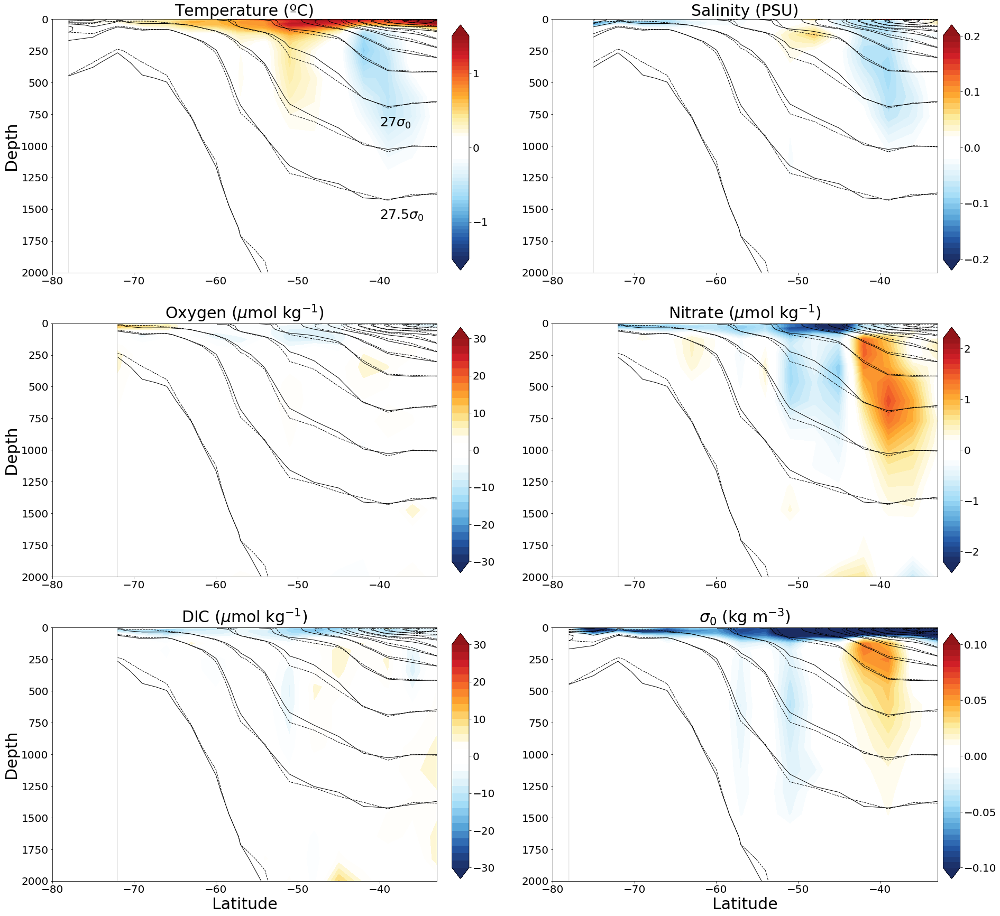

In [38]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')

# temp
norm = col.Normalize(vmin=-1.5,vmax=1.5) 
levels = np.arange(-1.5,1.51,0.05)
temp = zonal_contour_plot_sigma(ax, Ruth_SOCCOM_Temp_zonal_summer_bias, Ruth_SOCCOM_Temp_zonal_summer_bias.latitude, Ruth_SOCCOM_Temp_zonal_summer_bias.depth, cmap , norm , levels,soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
ax.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax.text(-40, 850, r'27$\sigma_0$', fontsize = 25)


#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.21,0.01)
salt = zonal_contour_plot_sigma(ax1, Ruth_SOCCOM_Salt_zonal_summer_bias, Ruth_SOCCOM_Salt_zonal_summer_bias.latitude, Ruth_SOCCOM_Salt_zonal_summer_bias.depth, cmap , norm , levels,soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_contour_plot_sigma(ax2, Ruth_SOCCOM_Oxygen_zonal_summer_bias, Ruth_SOCCOM_Oxygen_zonal_summer_bias.latitude, Ruth_SOCCOM_Oxygen_zonal_summer_bias.depth, cmap , norm , levels,soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_contour_plot_sigma(ax3, Ruth_SOCCOM_Nitrate_zonal_summer_bias, Ruth_SOCCOM_Nitrate_zonal_summer_bias.latitude, Ruth_SOCCOM_Nitrate_zonal_summer_bias.depth, cmap , norm , levels,soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_contour_plot_sigma(ax4, Ruth_SOCCOM_DIC_zonal_summer_bias, Ruth_SOCCOM_DIC_zonal_summer_bias.latitude, Ruth_SOCCOM_DIC_zonal_summer_bias.depth, cmap , norm , levels,soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#sigma0
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
levels = np.arange(-0.1,0.105,0.005)
sigma = zonal_contour_plot_sigma(ax5, Ruth_SOCCOM_Sigma_zonal_summer_bias, Ruth_SOCCOM_Sigma_zonal_summer_bias.latitude, Ruth_SOCCOM_Sigma_zonal_summer_bias.depth, cmap , norm , levels,soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_bathy)
ax5.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

# figurepath = 'F1_F2-reproduction-no-bathymery.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

In [39]:
# glodap seasonal bias correction
Ruth_GLODAP_Temp_zonal_BC_bathy = Ruth_GLODAP_Temp_zonal_bathy - Ruth_SOCCOM_Temp_zonal_summer_bias
Ruth_GLODAP_Salt_zonal_BC_bathy = Ruth_GLODAP_Salt_zonal_bathy - Ruth_SOCCOM_Salt_zonal_summer_bias
Ruth_GLODAP_Oxygen_zonal_BC_bathy = Ruth_GLODAP_Oxygen_zonal_bathy - Ruth_SOCCOM_Oxygen_zonal_summer_bias
Ruth_GLODAP_Nitrate_zonal_BC_bathy = Ruth_GLODAP_Nitrate_zonal_bathy - Ruth_SOCCOM_Nitrate_zonal_summer_bias
Ruth_GLODAP_DIC_zonal_BC_bathy = Ruth_GLODAP_DIC_zonal_bathy - Ruth_SOCCOM_DIC_zonal_summer_bias
Ruth_GLODAP_Sigma_zonal_BC_bathy = Ruth_GLODAP_Sigma_zonal_bathy - Ruth_SOCCOM_Sigma_zonal_summer_bias

In [40]:
Ruth_anomaly_Temp_zonal_BC_bathy = Ruth_SOCCOM_Temp_zonal_bathy - Ruth_GLODAP_Temp_zonal_BC_bathy
Ruth_anomaly_Salt_zonal_BC_bathy = Ruth_SOCCOM_Salt_zonal_bathy - Ruth_GLODAP_Salt_zonal_BC_bathy
Ruth_anomaly_Oxygen_zonal_BC_bathy = Ruth_SOCCOM_Oxygen_zonal_bathy - Ruth_GLODAP_Oxygen_zonal_BC_bathy
Ruth_anomaly_Nitrate_zonal_BC_bathy = Ruth_SOCCOM_Nitrate_zonal_bathy - Ruth_GLODAP_Nitrate_zonal_BC_bathy
Ruth_anomaly_DIC_zonal_BC_bathy = Ruth_SOCCOM_DIC_zonal_bathy - Ruth_GLODAP_DIC_zonal_BC_bathy
Ruth_anomaly_Sigma_zonal_BC_bathy = Ruth_SOCCOM_Sigma_zonal_bathy - Ruth_GLODAP_Sigma_zonal_BC_bathy

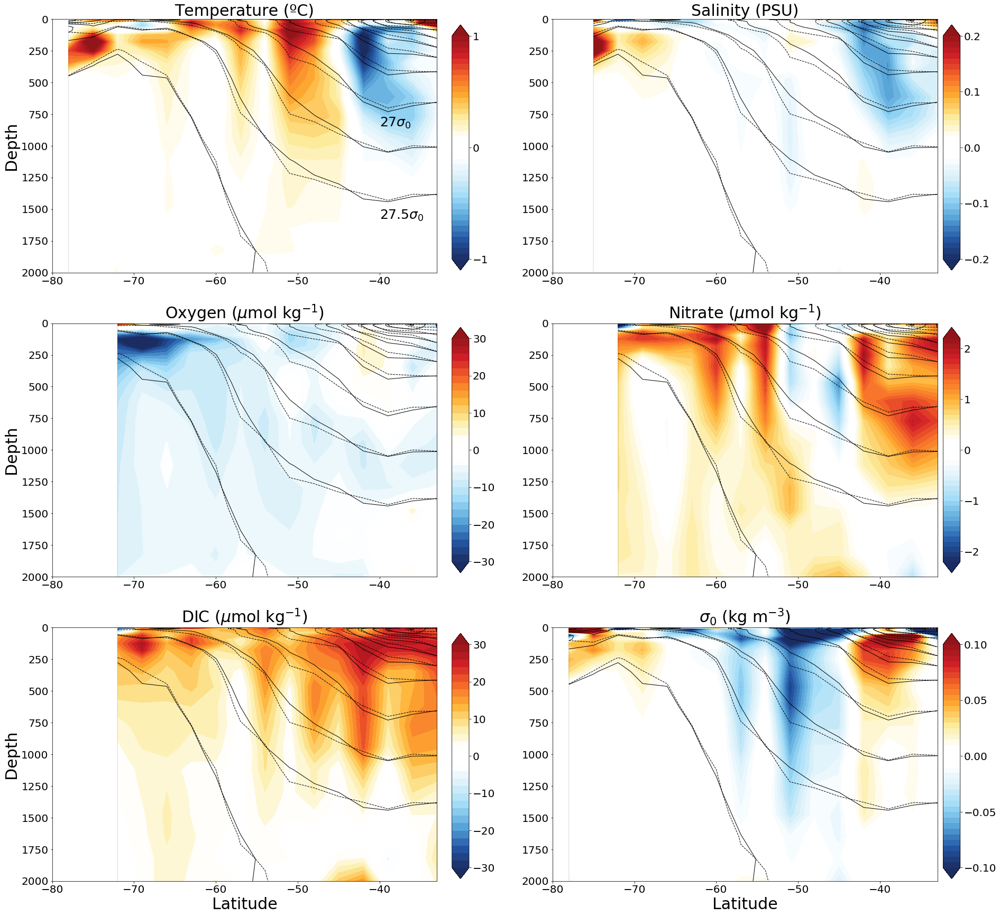

In [41]:
fig = plt.figure(figsize=[30, 30])
gs = gridspec.GridSpec(3,2)
ax, ax1, ax2, ax3, ax4, ax5 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1])
gs.update(hspace = 0.2, wspace = 0.3)

cmap = nclcmaps.cmap('BlueWhiteOrangeRed')

# temp
norm = col.Normalize(vmin=-1,vmax=1) 
levels = np.arange(-1,1.01,0.05)
temp = zonal_contour_plot_sigma(ax, Ruth_anomaly_Temp_zonal_BC_bathy, Ruth_anomaly_Temp_zonal_BC_bathy.latitude, Ruth_anomaly_Temp_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Temperature (ºC)', fontsize = 30)
ax.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax.text(-40, 850, r'27$\sigma_0$', fontsize = 25)


#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.21,0.01)
salt = zonal_contour_plot_sigma(ax1, Ruth_anomaly_Salt_zonal_BC_bathy, Ruth_anomaly_Salt_zonal_BC_bathy.latitude, Ruth_anomaly_Salt_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax1.set_title('Salinity (PSU)', fontsize = 30)
#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_contour_plot_sigma(ax2, Ruth_anomaly_Oxygen_zonal_BC_bathy, Ruth_anomaly_Oxygen_zonal_BC_bathy.latitude, Ruth_anomaly_Oxygen_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax2.set_ylabel('Depth', fontsize = 30)
ax2.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
levels = np.arange(-2.2,2.201,0.1)
nitrate = zonal_contour_plot_sigma(ax3, Ruth_anomaly_Nitrate_zonal_BC_bathy, Ruth_anomaly_Nitrate_zonal_BC_bathy.latitude, Ruth_anomaly_Nitrate_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax3.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_contour_plot_sigma(ax4, Ruth_anomaly_DIC_zonal_BC_bathy, Ruth_anomaly_DIC_zonal_BC_bathy.latitude, Ruth_anomaly_DIC_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax4.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax4.set_ylabel('Depth', fontsize = 30)
ax4.set_xlabel('Latitude', fontsize = 30)
#sigma0
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
levels = np.arange(-0.1,0.105,0.005)
sigma = zonal_contour_plot_sigma(ax5, Ruth_anomaly_Sigma_zonal_BC_bathy, Ruth_anomaly_Sigma_zonal_BC_bathy.latitude, Ruth_anomaly_Sigma_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax5.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax5.set_xlabel('Latitude', fontsize = 30)

cax = fig.add_axes([0.475, 0.66, 0.015, 0.215])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.905, 0.66, 0.015, 0.215])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cax = fig.add_axes([0.475, 0.395, 0.015, 0.215])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.395, 0.015, 0.215])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cax = fig.add_axes([0.475, 0.127, 0.015, 0.215])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cax = fig.add_axes([0.905, 0.127, 0.015, 0.215])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])

# figurepath = 'F1_F2-reproduction-bathymetry-masked.png'
# plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)

plt.show()

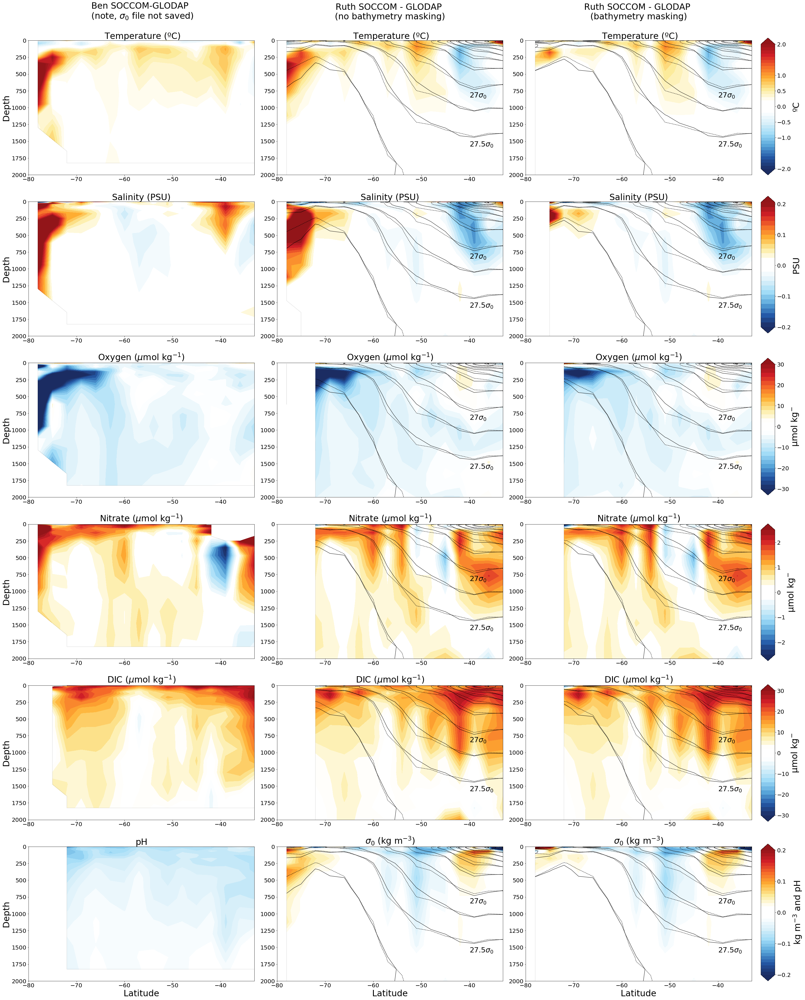

In [42]:
fig = plt.figure(figsize=[45, 60])
gs = gridspec.GridSpec(6,3)
ax, ax1, ax2, ax3, ax4, ax5 , ax6, ax7,ax8= plt.subplot(gs[0,0]), plt.subplot(gs[0,1]),plt.subplot(gs[0,2]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[1,2]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1]), plt.subplot(gs[2,2])
ax9, ax10, ax11, ax12, ax13, ax14 , ax15, ax16,ax17= plt.subplot(gs[3,0]), plt.subplot(gs[3,1]),plt.subplot(gs[3,2]), plt.subplot(gs[4,0]), plt.subplot(gs[4,1]), plt.subplot(gs[4,2]), plt.subplot(gs[5,0]), plt.subplot(gs[5,1]), plt.subplot(gs[5,2])
gs.update(hspace = 0.2, wspace = 0.1)


cmap = nclcmaps.cmap('BlueWhiteOrangeRed')
# temp
norm = col.Normalize(vmin=-2,vmax=2) 
levels = np.arange(-2,2.05,0.1)
temp = zonal_contour_plot(ax, Ben_anomaly_Temp_zonal, Ben_anomaly_Temp_zonal.latitude, Ben_anomaly_Temp_zonal.depth, cmap , norm , levels)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Ben SOCCOM-GLODAP \n (note, $\sigma_0$ file not saved) \n \n Temperature (ºC)', fontsize = 30)
temp = zonal_contour_plot_sigma(ax1, Ruth_anomaly_Temp_zonal_BC, Ruth_anomaly_Temp_zonal_BC.latitude, Ruth_anomaly_Temp_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax1.set_title('Ruth SOCCOM - GLODAP \n (no bathymetry masking) \n \n Temperature (ºC)', fontsize = 30)
ax1.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax1.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
temp = zonal_contour_plot_sigma(ax2, Ruth_anomaly_Temp_zonal_BC_bathy, Ruth_anomaly_Temp_zonal_BC_bathy.latitude, Ruth_anomaly_Temp_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax2.set_title('Ruth SOCCOM - GLODAP \n (bathymetry masking) \n \n Temperature (ºC)', fontsize = 30)
ax2.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax2.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

#salt
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.21,0.015)
salt = zonal_contour_plot(ax3, Ben_anomaly_Salt_zonal, Ben_anomaly_Salt_zonal.latitude, Ben_anomaly_Salt_zonal.depth, cmap , norm , levels)
ax3.set_ylabel('Depth', fontsize = 30)
ax3.set_title('Salinity (PSU)', fontsize = 30)
salt = zonal_contour_plot_sigma(ax4, Ruth_anomaly_Salt_zonal_BC, Ruth_anomaly_Salt_zonal_BC.latitude, Ruth_anomaly_Salt_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax4.set_title('Salinity (PSU)', fontsize = 30)
salt = zonal_contour_plot_sigma(ax5, Ruth_anomaly_Salt_zonal_BC_bathy, Ruth_anomaly_Salt_zonal_BC_bathy.latitude, Ruth_anomaly_Salt_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax5.set_title('Salinity (PSU)', fontsize = 30)
ax4.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax4.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax5.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax5.text(-40, 850, r'27$\sigma_0$', fontsize = 25)


#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
oxygen = zonal_contour_plot(ax6, Ben_anomaly_Oxygen_zonal, Ben_anomaly_Oxygen_zonal.latitude, Ben_anomaly_Oxygen_zonal.depth, cmap , norm , levels)
ax6.set_ylabel('Depth', fontsize = 30)
ax6.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
oxygen = zonal_contour_plot_sigma(ax7, Ruth_anomaly_Oxygen_zonal_BC, Ruth_anomaly_Oxygen_zonal_BC.latitude, Ruth_anomaly_Oxygen_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax7.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
oxygen = zonal_contour_plot_sigma(ax8, Ruth_anomaly_Oxygen_zonal_BC_bathy, Ruth_anomaly_Oxygen_zonal_BC_bathy.latitude, Ruth_anomaly_Oxygen_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax8.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax7.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax7.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax8.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax8.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

#nitrate
norm = col.Normalize(vmin=-2.5,vmax=2.5) 
levels = np.arange(-2.5,2.501,0.2)
nitrate = zonal_contour_plot(ax9, Ben_anomaly_Nitrate_zonal, Ben_anomaly_Nitrate_zonal.latitude, Ben_anomaly_Nitrate_zonal.depth, cmap , norm , levels)
ax9.set_ylabel('Depth', fontsize = 30)
ax9.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
nitrate = zonal_contour_plot_sigma(ax10, Ruth_anomaly_Nitrate_zonal_BC, Ruth_anomaly_Nitrate_zonal_BC.latitude, Ruth_anomaly_Nitrate_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax10.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
nitrate = zonal_contour_plot_sigma(ax11, Ruth_anomaly_Nitrate_zonal_BC_bathy, Ruth_anomaly_Nitrate_zonal_BC_bathy.latitude, Ruth_anomaly_Nitrate_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax11.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax10.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax10.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax11.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax11.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

#dic
norm = col.Normalize(vmin=-30,vmax=30) 
levels = np.arange(-30,30.1,2)
dic = zonal_contour_plot(ax12, Ben_anomaly_DIC_zonal, Ben_anomaly_DIC_zonal.latitude, Ben_anomaly_DIC_zonal.depth, cmap , norm , levels)
ax12.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax12.set_ylabel('Depth', fontsize = 30)
dic = zonal_contour_plot_sigma(ax13, Ruth_anomaly_DIC_zonal_BC, Ruth_anomaly_DIC_zonal_BC.latitude, Ruth_anomaly_DIC_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax13.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
dic = zonal_contour_plot_sigma(ax14, Ruth_anomaly_DIC_zonal_BC_bathy, Ruth_anomaly_DIC_zonal_BC_bathy.latitude, Ruth_anomaly_DIC_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax14.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax13.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax13.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax14.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax14.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

#pH
norm = col.Normalize(vmin=-0.2,vmax=0.2) 
levels = np.arange(-0.2,0.205,0.01)
pH = zonal_contour_plot(ax15, Ben_anomaly_pH_zonal, Ben_anomaly_pH_zonal.latitude, Ben_anomaly_pH_zonal.depth, cmap , norm , levels)
ax15.set_title(r'pH', fontsize = 30)
ax15.set_ylabel('Depth', fontsize = 30)
ax15.set_xlabel('Latitude', fontsize = 30)
sigma = zonal_contour_plot_sigma(ax16, Ruth_anomaly_Sigma_zonal_BC, Ruth_anomaly_Sigma_zonal_BC.latitude, Ruth_anomaly_Sigma_zonal_BC.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax16.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax16.set_xlabel('Latitude', fontsize = 30)
sigma = zonal_contour_plot_sigma(ax17, Ruth_anomaly_Sigma_zonal_BC_bathy, Ruth_anomaly_Sigma_zonal_BC_bathy.latitude, Ruth_anomaly_Sigma_zonal_BC_bathy.depth, cmap , norm , levels, soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax17.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax17.set_xlabel('Latitude', fontsize = 30)
ax16.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax16.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax17.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax17.text(-40, 850, r'27$\sigma_0$', fontsize = 25)


cax = fig.add_axes([0.91, 0.772, 0.015, 0.11])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,-0.5,0,0.5,1,2])
cbar.set_label('ºC', fontsize = 30)

cax = fig.add_axes([0.91, 0.645, 0.015, 0.11])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cbar.set_label('PSU', fontsize = 30)

cax = fig.add_axes([0.91, 0.515, 0.015, 0.11])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cbar.set_label('µmol kg$^{-}$', fontsize = 30)

cax = fig.add_axes([0.91, 0.382, 0.015, 0.11])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cbar.set_label('µmol kg$^{-}$', fontsize = 30)

cax = fig.add_axes([0.91, 0.253, 0.015, 0.11])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cbar.set_label('µmol kg$^{-}$', fontsize = 30)

cax = fig.add_axes([0.91, 0.125, 0.015, 0.11])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.2,-0.1,0,0.1,0.2])
cbar.set_label('kg m$^{-3}$ and pH', fontsize = 30)

figurepath = 'F1_F2-reproduction-contour.png'
plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)


plt.show()

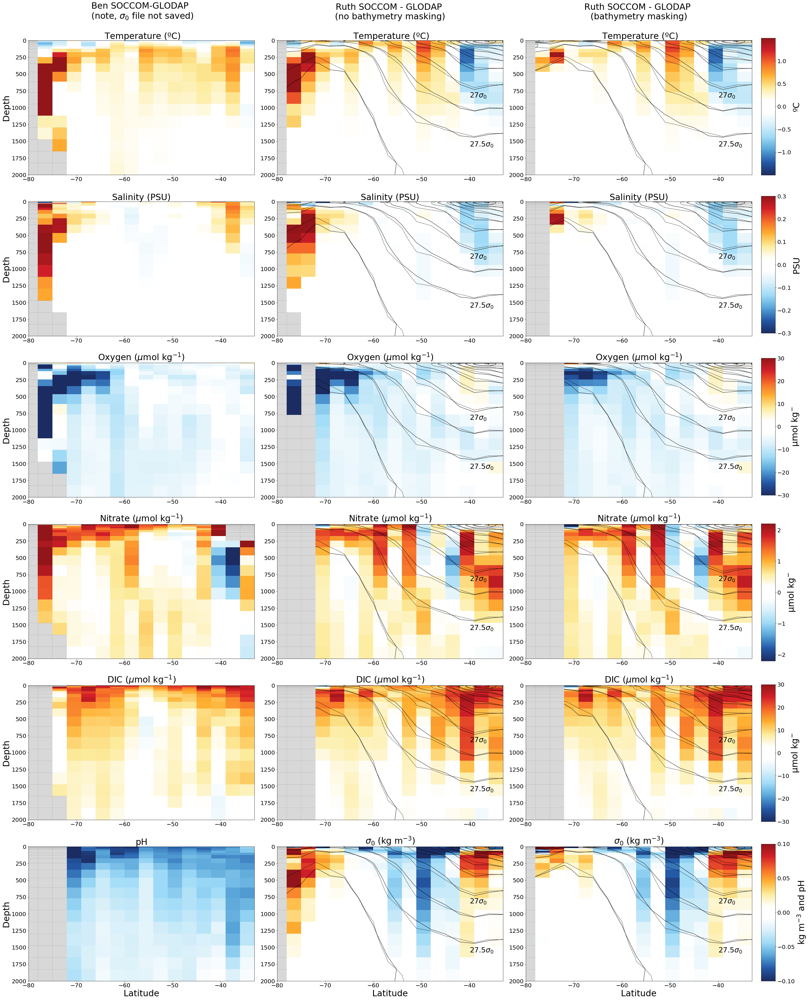

In [43]:
fig = plt.figure(figsize=[45, 60])
gs = gridspec.GridSpec(6,3)
ax, ax1, ax2, ax3, ax4, ax5 , ax6, ax7,ax8= plt.subplot(gs[0,0]), plt.subplot(gs[0,1]),plt.subplot(gs[0,2]), plt.subplot(gs[1,0]), plt.subplot(gs[1,1]), plt.subplot(gs[1,2]), plt.subplot(gs[2,0]), plt.subplot(gs[2,1]), plt.subplot(gs[2,2])
ax9, ax10, ax11, ax12, ax13, ax14 , ax15, ax16,ax17= plt.subplot(gs[3,0]), plt.subplot(gs[3,1]),plt.subplot(gs[3,2]), plt.subplot(gs[4,0]), plt.subplot(gs[4,1]), plt.subplot(gs[4,2]), plt.subplot(gs[5,0]), plt.subplot(gs[5,1]), plt.subplot(gs[5,2])
gs.update(hspace = 0.2, wspace = 0.1)


cmap = nclcmaps.cmap('BlueWhiteOrangeRed')
cmap.set_bad('grey',0.3)

# temp
norm = col.Normalize(vmin=-1.5,vmax=1.5) 
temp = zonal_mesh_plot(ax, Ben_anomaly_Temp_zonal, Ben_anomaly_Temp_zonal.latitude, Ben_anomaly_Temp_zonal.depth, cmap , norm)
ax.set_ylabel('Depth', fontsize = 30)
ax.set_title('Ben SOCCOM-GLODAP \n (note, $\sigma_0$ file not saved) \n \n Temperature (ºC)', fontsize = 30)
temp = zonal_mesh_plot_sigma(ax1, Ruth_anomaly_Temp_zonal_BC, Ruth_anomaly_Temp_zonal_BC.latitude, Ruth_anomaly_Temp_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax1.set_title('Ruth SOCCOM - GLODAP \n (no bathymetry masking) \n \n Temperature (ºC)', fontsize = 30)
ax1.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax1.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
temp = zonal_mesh_plot_sigma(ax2, Ruth_anomaly_Temp_zonal_BC_bathy, Ruth_anomaly_Temp_zonal_BC_bathy.latitude, Ruth_anomaly_Temp_zonal_BC_bathy.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax2.set_title('Ruth SOCCOM - GLODAP \n (bathymetry masking) \n \n Temperature (ºC)', fontsize = 30)
ax2.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax2.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

#salt
norm = col.Normalize(vmin=-0.3,vmax=0.3) 
salt = zonal_mesh_plot(ax3, Ben_anomaly_Salt_zonal, Ben_anomaly_Salt_zonal.latitude, Ben_anomaly_Salt_zonal.depth, cmap , norm )
ax3.set_ylabel('Depth', fontsize = 30)
ax3.set_title('Salinity (PSU)', fontsize = 30)
salt = zonal_mesh_plot_sigma(ax4, Ruth_anomaly_Salt_zonal_BC, Ruth_anomaly_Salt_zonal_BC.latitude, Ruth_anomaly_Salt_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax4.set_title('Salinity (PSU)', fontsize = 30)
salt = zonal_mesh_plot_sigma(ax5, Ruth_anomaly_Salt_zonal_BC_bathy, Ruth_anomaly_Salt_zonal_BC_bathy.latitude, Ruth_anomaly_Salt_zonal_BC_bathy.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax5.set_title('Salinity (PSU)', fontsize = 30)


#oxygen
norm = col.Normalize(vmin=-30,vmax=30) 
oxygen = zonal_mesh_plot(ax6, Ben_anomaly_Oxygen_zonal, Ben_anomaly_Oxygen_zonal.latitude, Ben_anomaly_Oxygen_zonal.depth, cmap , norm )
ax6.set_ylabel('Depth', fontsize = 30)
ax6.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
oxygen = zonal_mesh_plot_sigma(ax7, Ruth_anomaly_Oxygen_zonal_BC, Ruth_anomaly_Oxygen_zonal_BC.latitude, Ruth_anomaly_Oxygen_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax7.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)
oxygen = zonal_mesh_plot_sigma(ax8, Ruth_anomaly_Oxygen_zonal_BC_bathy, Ruth_anomaly_Oxygen_zonal_BC_bathy.latitude, Ruth_anomaly_Oxygen_zonal_BC_bathy.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax8.set_title(r'Oxygen ($\mu$mol kg$^{-1}$)', fontsize = 30)

#nitrate
norm = col.Normalize(vmin=-2.2,vmax=2.2) 
nitrate = zonal_mesh_plot(ax9, Ben_anomaly_Nitrate_zonal, Ben_anomaly_Nitrate_zonal.latitude, Ben_anomaly_Nitrate_zonal.depth, cmap , norm )
ax9.set_ylabel('Depth', fontsize = 30)
ax9.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
nitrate = zonal_mesh_plot_sigma(ax10, Ruth_anomaly_Nitrate_zonal_BC, Ruth_anomaly_Nitrate_zonal_BC.latitude, Ruth_anomaly_Nitrate_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax10.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)
nitrate = zonal_mesh_plot_sigma(ax11, Ruth_anomaly_Nitrate_zonal_BC_bathy, Ruth_anomaly_Nitrate_zonal_BC_bathy.latitude, Ruth_anomaly_Nitrate_zonal_BC_bathy.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax11.set_title(r'Nitrate ($\mu$mol kg$^{-1}$)', fontsize = 30)

#dic
norm = col.Normalize(vmin=-30,vmax=30) 
dic = zonal_mesh_plot(ax12, Ben_anomaly_DIC_zonal, Ben_anomaly_DIC_zonal.latitude, Ben_anomaly_DIC_zonal.depth, cmap , norm )
ax12.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
ax12.set_ylabel('Depth', fontsize = 30)
dic = zonal_mesh_plot_sigma(ax13, Ruth_anomaly_DIC_zonal_BC, Ruth_anomaly_DIC_zonal_BC.latitude, Ruth_anomaly_DIC_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax13.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)
dic = zonal_mesh_plot_sigma(ax14, Ruth_anomaly_DIC_zonal_BC_bathy, Ruth_anomaly_DIC_zonal_BC_bathy.latitude, Ruth_anomaly_DIC_zonal_BC_bathy.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax14.set_title(r'DIC ($\mu$mol kg$^{-1}$)', fontsize = 30)

#pH
norm = col.Normalize(vmin=-0.1,vmax=0.1) 
pH = zonal_mesh_plot(ax15, Ben_anomaly_pH_zonal, Ben_anomaly_pH_zonal.latitude, Ben_anomaly_pH_zonal.depth, cmap , norm )
ax15.set_title(r'pH', fontsize = 30)
ax15.set_ylabel('Depth', fontsize = 30)
ax15.set_xlabel('Latitude', fontsize = 30)
sigma = zonal_mesh_plot_sigma(ax16, Ruth_anomaly_Sigma_zonal_BC, Ruth_anomaly_Sigma_zonal_BC.latitude, Ruth_anomaly_Sigma_zonal_BC.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC)
ax16.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax16.set_xlabel('Latitude', fontsize = 30)
sigma = zonal_mesh_plot_sigma(ax17, Ruth_anomaly_Sigma_zonal_BC_bathy, Ruth_anomaly_Sigma_zonal_BC_bathy.latitude, Ruth_anomaly_Sigma_zonal_BC_bathy.depth, cmap , norm , soccom_sigma = Ruth_SOCCOM_Sigma_zonal_bathy, glodap_sigma = Ruth_GLODAP_Sigma_zonal_BC_bathy)
ax17.set_title(r'$\sigma_0$ (kg m$^{-3}$)', fontsize = 30)
ax17.set_xlabel('Latitude', fontsize = 30)


ax4.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax4.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax5.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax5.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

ax7.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax7.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax8.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax8.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

ax10.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax10.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax11.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax11.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

ax13.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax13.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax14.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax14.text(-40, 850, r'27$\sigma_0$', fontsize = 25)

ax16.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax16.text(-40, 850, r'27$\sigma_0$', fontsize = 25)
ax17.text(-40, 1580, r'27.5$\sigma_0$', fontsize = 25)
ax17.text(-40, 850, r'27$\sigma_0$', fontsize = 25)


cax = fig.add_axes([0.91, 0.772, 0.015, 0.11])
cbar=plt.colorbar(temp,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-1,-0.5,0,0.5,1])
cbar.set_label('ºC', fontsize = 30)

cax = fig.add_axes([0.91, 0.645, 0.015, 0.11])
cbar=plt.colorbar(salt,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.3,-0.2,-0.1,0,0.1,0.2,0.3])
cbar.set_label('PSU', fontsize = 30)

cax = fig.add_axes([0.91, 0.515, 0.015, 0.11])
cbar=plt.colorbar(oxygen,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cbar.set_label('µmol kg$^{-}$', fontsize = 30)

cax = fig.add_axes([0.91, 0.382, 0.015, 0.11])
cbar=plt.colorbar(nitrate,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-2,-1,0,1,2])
cbar.set_label('µmol kg$^{-}$', fontsize = 30)

cax = fig.add_axes([0.91, 0.253, 0.015, 0.11])
cbar=plt.colorbar(dic,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-30,-20,-10,0,10,20,30])
cbar.set_label('µmol kg$^{-}$', fontsize = 30)

cax = fig.add_axes([0.91, 0.125, 0.015, 0.11])
cbar=plt.colorbar(sigma,cax = cax,orientation='vertical',shrink = 0.5, ticks = [-0.1,-0.05,0,0.05,0.1])
cbar.set_label('kg m$^{-3}$ and pH', fontsize = 30)

figurepath = 'F1_F2-reproduction-mesh.png'
plt.savefig(figurepath, dpi=None, facecolor='w', edgecolor='w',orientation='portrait', papertype=None, format='png',transparent=False, bbox_inches='tight', pad_inches=0.1,frameon=None)


plt.show()